In [41]:
import scvelo as scv
import dynamo as dyn
import numpy as np
from anndata import AnnData
# import loompy
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.cluster.hierarchy import fcluster,leaders
from sklearn.decomposition import PCA
from scipy.linalg import inv
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture
from RKHS import SparseVFC
from RKHS import Jacobian_rkhs_gaussian
from scipy.stats import multivariate_normal
from scipy.sparse import csr_matrix

import argparse
import random

import scipy.sparse as sp
import scipy.sparse.csgraph
import sklearn.linear_model as sklm
import sklearn.metrics as skm
import sklearn.model_selection as skms
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import SGD
from ignite.engine import Engine, Events
from ignite.handlers import ModelCheckpoint
from torch.utils.data import DataLoader, IterableDataset, get_worker_info

CHECKPOINT_PREFIX = "g2g"

from g2g_model_Fisher import CompleteKPartiteGraph,AttributedGraph,GraphDataset,Encoder,\
                            level_sets,train_test_split,reset_seeds
from minepy import MINE

In [2]:
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.is_available())
print(torch.cuda.device_count())
# print(torch.cuda.current_device())

2.1.0.dev20230726
None
False
0


In [3]:
data_path='data/'
result_path='results/'
adata0=scv.read(data_path+'EG_new.h5ad', cache=True)
adata0

AnnData object with n_obs × n_vars = 2322 × 1000
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'palantir_pseudotime', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'highly_variable_genes', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling'
    uns: 'clusters_colors', 'clusters_fine_colors', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca', 'recover_dynamics', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_param

In [4]:
gene_arr=adata0.var.index.values
X_pca=adata0.obsm['X_pca']
X_umap=adata0.obsm['X_umap']
cell_vpt=adata0.obs['velocity_pseudotime'].values#adata0.obs['latent_time'].values#
Xs=adata0.layers['Ms']#adata.X.A#
X_pca.shape

(2322, 30)

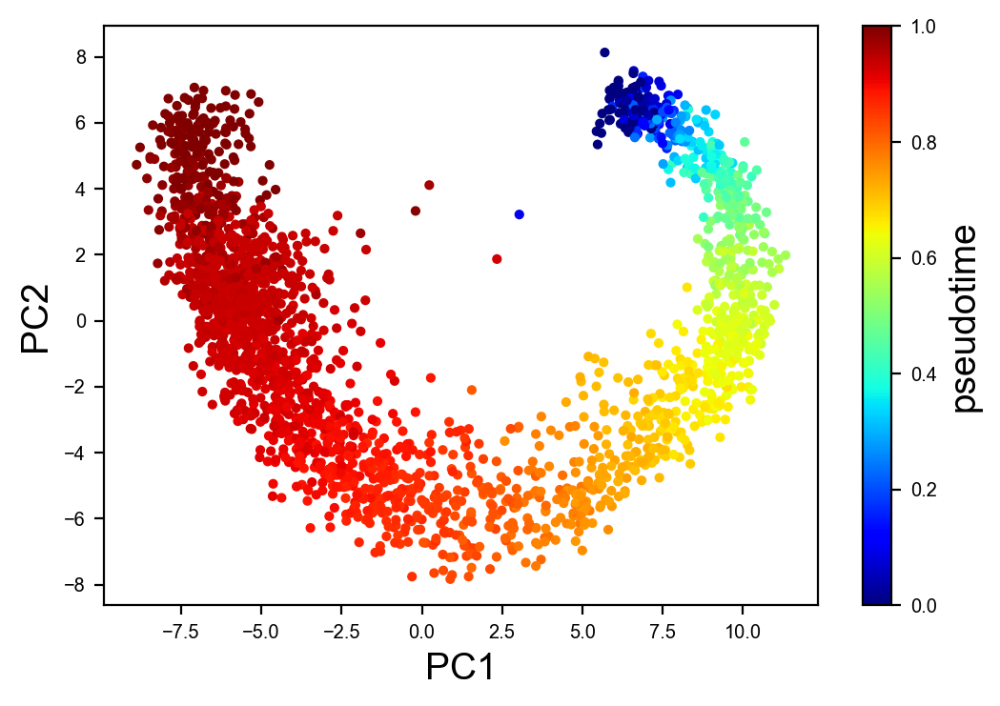

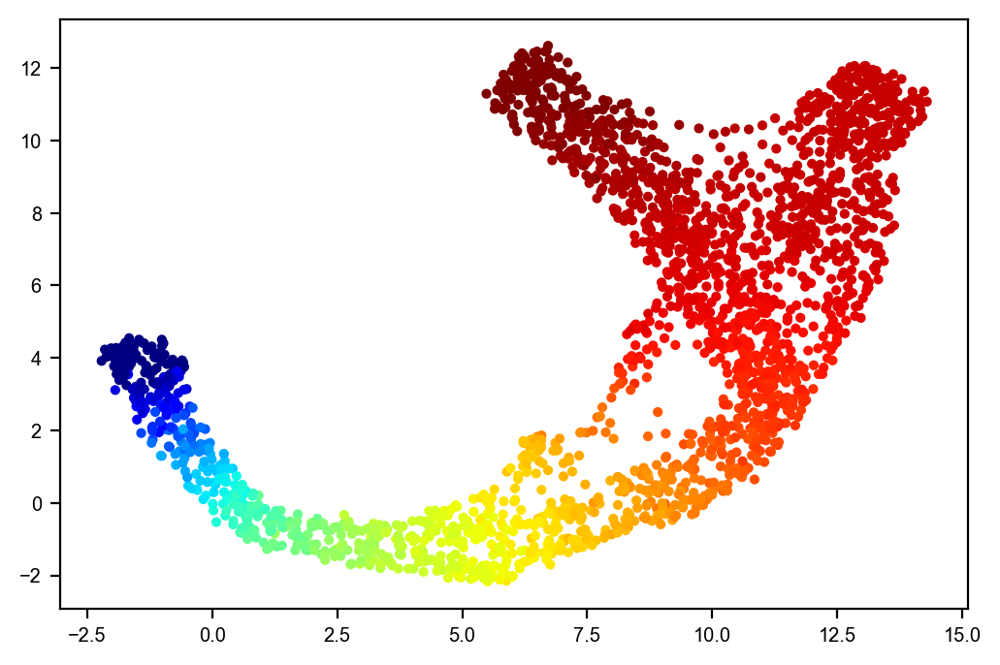

In [5]:
plt.scatter(X_pca[:,0],X_pca[:,1],s=10,c=cell_vpt,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
clb=plt.colorbar()


clb.ax.set_ylabel('pseudotime',fontsize=14)

plt.savefig(result_path+'EG_vpt.png',dpi=300)
plt.show()

plt.scatter(X_umap[:,0],X_umap[:,1],s=10,c=cell_vpt,cmap=plt.cm.jet)
plt.show()


In [7]:
#-------data preprocessing
k_nei=10
adata=adata0.copy()
scv.pp.neighbors(adata, n_neighbors=k_nei)
scv.pp.pca(adata,n_comps=50)
scv.pp.moments(adata, n_pcs=50, n_neighbors=k_nei)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [8]:

row =np.array([np.ones((k_nei,))*i for i in range(adata.shape[0])]).flatten()

col=adata.uns['neighbors']['indices'].flatten()

w_val=np.array([np.linalg.norm(X_pca[int(i),:]-X_pca[int(j),:]) for i,j in zip(row,col)])

adj_val=np.ones(col.shape)

A_mat=csr_matrix((adj_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))

W_mat=csr_matrix((w_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))

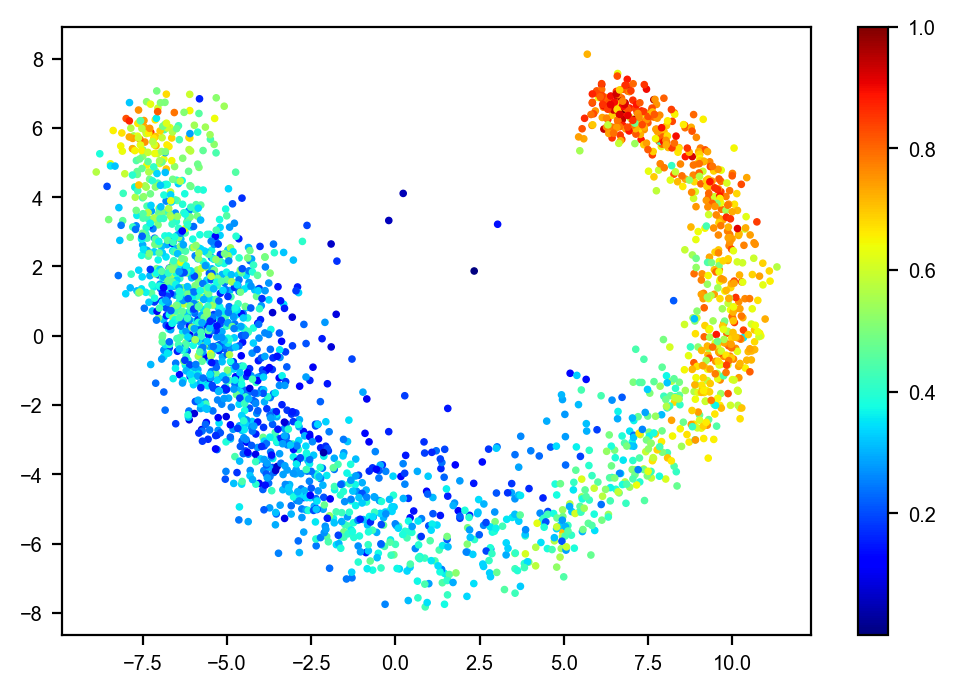

In [9]:
#--------calculate neighbor distance and define smooth funciton with gaussian kernel
#-----check "Study on density peaks clustering based on k-nearest neighbors and principal component analysis
#--------Mingjing Du et al 2016

dc=np.mean(w_val)

cell_nei=adata.uns['neighbors']['indices']
nei_w=[]
rho_arr=[]
for ni in adata.uns['neighbors']['indices']:
    dij=np.array([np.linalg.norm(X_pca[int(ni[0]),:]-X_pca[int(i),:]) for i in ni[1:]])
    
    rho=np.sum(np.exp(-dij**2/dc**2))
#     rho=np.exp(np.sum(-dij**2/dc**2))
    nei_w.append(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
#     print(dij)
#     print(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
    rho_arr.append(rho)
rho_arr=np.array(rho_arr)/np.amax(rho_arr)
nei_w=np.array(nei_w)
nei_w=np.hstack((np.ones((nei_w.shape[0],1)),nei_w))/2


plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=rho_arr,cmap=plt.cm.jet)
plt.colorbar()
plt.show()


def smooth_func(X_val,cell_nei,nei_w):
    X_sm=X_val.copy()
    for ci in range(len(X_val)):
        X_sm[ci]=np.dot(X_val[cell_nei[ci,:]],nei_w[ci,:])
    return X_sm

In [11]:
# def get_snn_similarity(x0, x1):#Shared Nearest-neighbor graph
# #     print(len(x0.intersection(x1)))
#     return len(x0.intersection(x1))*1.0 / len(x0)

# neighbors = np.array([set(A_mat[i].nonzero()[1]) for i in range(adata.shape[0])])
# snn_distance_matrix = np.asarray([[get_snn_similarity(neighbors[i], neighbors[j]) \
#                                    for j in range(len(neighbors))] for i in range(len(neighbors))])

# snn_thres=0.5
# snn_row=np.where(snn_distance_matrix>snn_thres)[0]
# snn_col=np.where(snn_distance_matrix>snn_thres)[1]
# print(snn_col.shape)
# print(len(np.unique(snn_col,return_counts=True)[1]))
# plt.hist(np.unique(snn_col,return_counts=True)[1],bins=50)
# plt.show()
# A_snn=csr_matrix((np.ones(snn_col.shape), (snn_row, snn_col)), shape=(adata.shape[0], adata.shape[0]))

In [10]:
epochs = 200
nsamples = 10
learning_rate = 1e-3
seed = 0
n_workers = 0
K =3# !!!!!!!!!! K should be large enough


if seed is not None:
    reset_seeds(seed)

A=A_mat
# X=Xs
X=Xs/np.mean(np.abs(Xs),axis=0)
# #--------
# scaler=StandardScaler()#
# X=scaler.fit_transform(Xs)
#-----
z=cell_vpt

n = A.shape[0]
train_nodes, val_nodes = train_test_split(n, train_ratio=1.0)
A_train = A[train_nodes, :][:, train_nodes]
X_train = X[train_nodes]
z_train = z[train_nodes]
A_val = A[val_nodes, :][:, val_nodes]
X_val = X[val_nodes]
z_val = z[val_nodes]

train_data = AttributedGraph(A_train, X_train, z_train, K)
val_data = AttributedGraph(A_val, X_val, z_val, K)

L = 3
encoder = Encoder(X.shape[1], L)

In [11]:
optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)

iterations = 200#epochs // n_workers
dataset = GraphDataset(train_data, nsamples, iterations)


loader = DataLoader(
    dataset,
    batch_size=1,
    num_workers=n_workers,
    worker_init_fn=reset_seeds,
    collate_fn=lambda args: args,
)

In [12]:
for batch_idx, data in enumerate(loader):
    encoder.train()
    optimizer.zero_grad()

    loss = encoder.compute_loss(data[0][0],data[0][1],data[0][2],data[0][3],data[0][4],data[0][5])
    if batch_idx% 10 == 0:
        print(batch_idx,loss)
    loss.backward()
    optimizer.step()

0 tensor(1.2787e+10, grad_fn=<DivBackward0>)
10 tensor(7.1699e+08, grad_fn=<DivBackward0>)
20 tensor(6.4651e+08, grad_fn=<DivBackward0>)
30 tensor(6.1158e+08, grad_fn=<DivBackward0>)
40 tensor(6.0941e+08, grad_fn=<DivBackward0>)
50 tensor(6.0088e+08, grad_fn=<DivBackward0>)
60 tensor(6.0020e+08, grad_fn=<DivBackward0>)
70 tensor(5.9310e+08, grad_fn=<DivBackward0>)
80 tensor(5.9364e+08, grad_fn=<DivBackward0>)
90 tensor(5.8281e+08, grad_fn=<DivBackward0>)
100 tensor(5.8494e+08, grad_fn=<DivBackward0>)
110 tensor(5.8882e+08, grad_fn=<DivBackward0>)
120 tensor(5.8105e+08, grad_fn=<DivBackward0>)
130 tensor(5.8620e+08, grad_fn=<DivBackward0>)
140 tensor(5.8030e+08, grad_fn=<DivBackward0>)
150 tensor(5.8140e+08, grad_fn=<DivBackward0>)
160 tensor(5.7690e+08, grad_fn=<DivBackward0>)
170 tensor(5.7699e+08, grad_fn=<DivBackward0>)
180 tensor(5.7700e+08, grad_fn=<DivBackward0>)
190 tensor(5.7425e+08, grad_fn=<DivBackward0>)


In [13]:
z=train_data.z
mu, sigma = encoder(train_data.X)
mu_learned = mu.detach().numpy()
sigma_learned = np.sqrt(sigma.detach().numpy())#sigma.detach().numpy()#

In [14]:
sort_idx = z.argsort()

match_idx=sort_idx[np.searchsorted(z,cell_vpt,sorter = sort_idx)]
print(match_idx)

[2108  964  702 ... 1593 2000  811]


In [15]:
X_mu=mu_learned[match_idx]
X_sigma=sigma_learned[match_idx]
X_label=z[match_idx]

In [16]:
latent_z=np.hstack((X_mu,X_sigma))

latent_z.shape

(2322, 6)

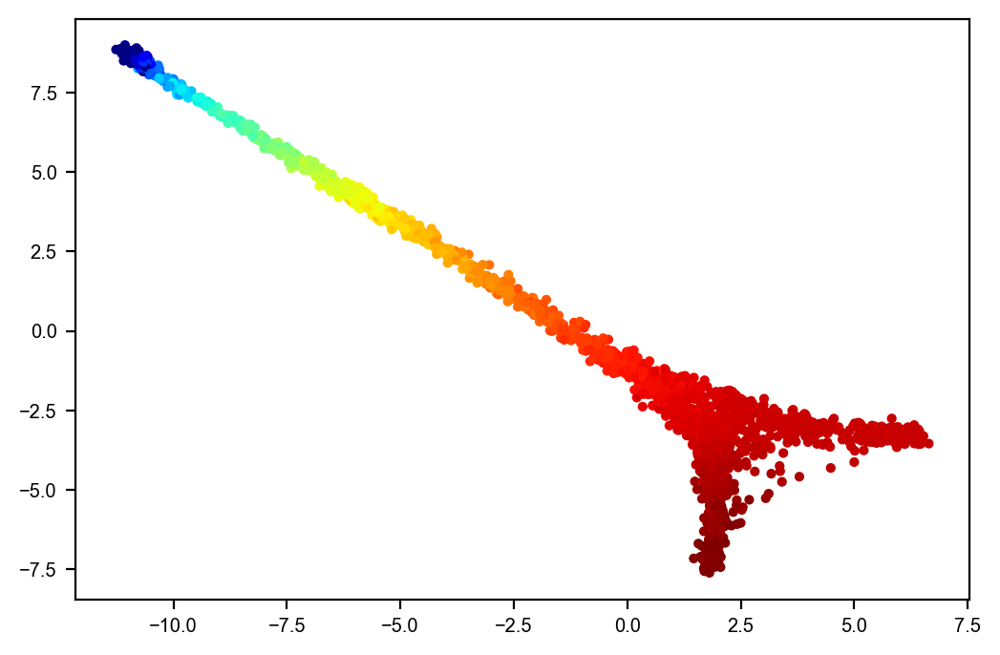

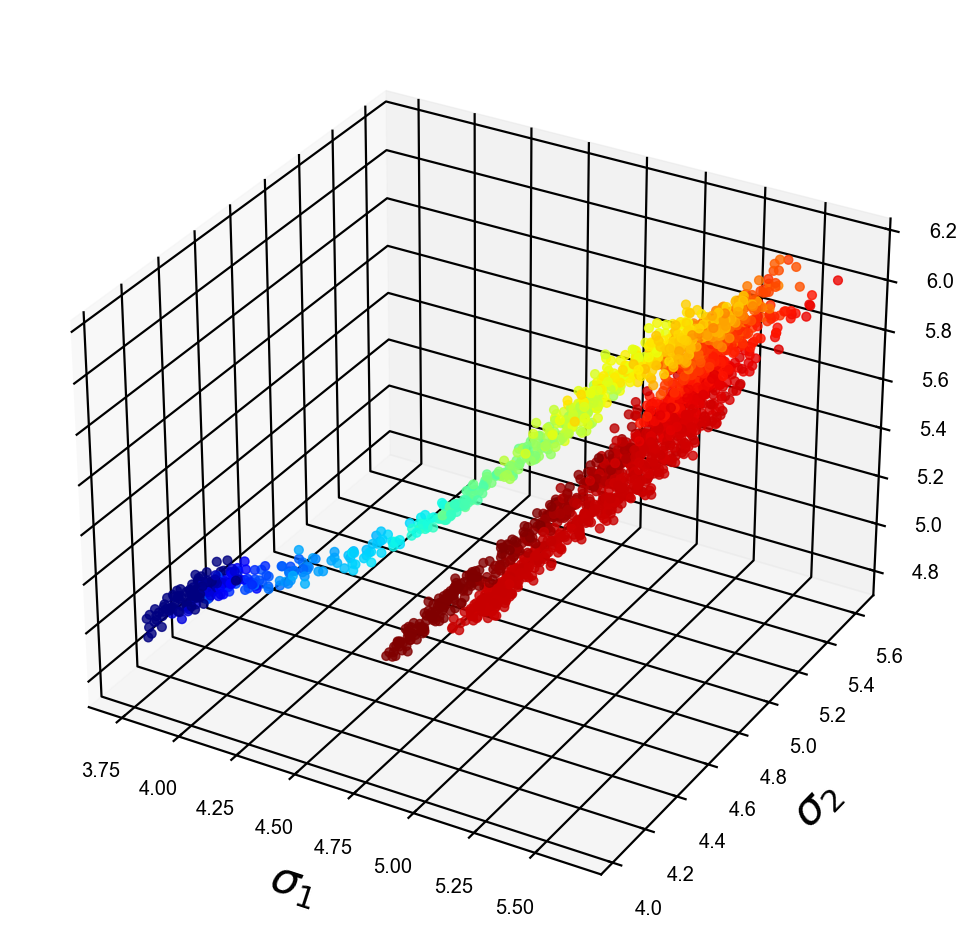

In [17]:


plt.scatter(X_mu[:,0],X_mu[:,1],s=10,c=X_label,cmap=plt.cm.jet)
plt.show()

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")
fig.add_axes(ax)
ax.scatter(
    X_sigma[:, 0],X_sigma[:, 1], X_sigma[:, 2], c=X_label, s=10, alpha=0.8,cmap=plt.cm.jet
)

ax.set_xlabel("$\sigma_1$",fontsize=16)
ax.set_ylabel("$\sigma_2$",fontsize=16)
ax.set_zlabel("$\sigma_3$",fontsize=16)
plt.savefig(result_path+'DG_Xsigma_vpt.png')
plt.show()

In [18]:
Fisher_g=np.zeros((X.shape[0],L*2,L*2))
for i in range(X.shape[0]):
    for j in range(L):
        Fisher_g[i,2*j,2*j]=1/(X_sigma[i,j]**2)
        Fisher_g[i,2*j+1,2*j+1]=2/(X_sigma[i,j]**2)

0


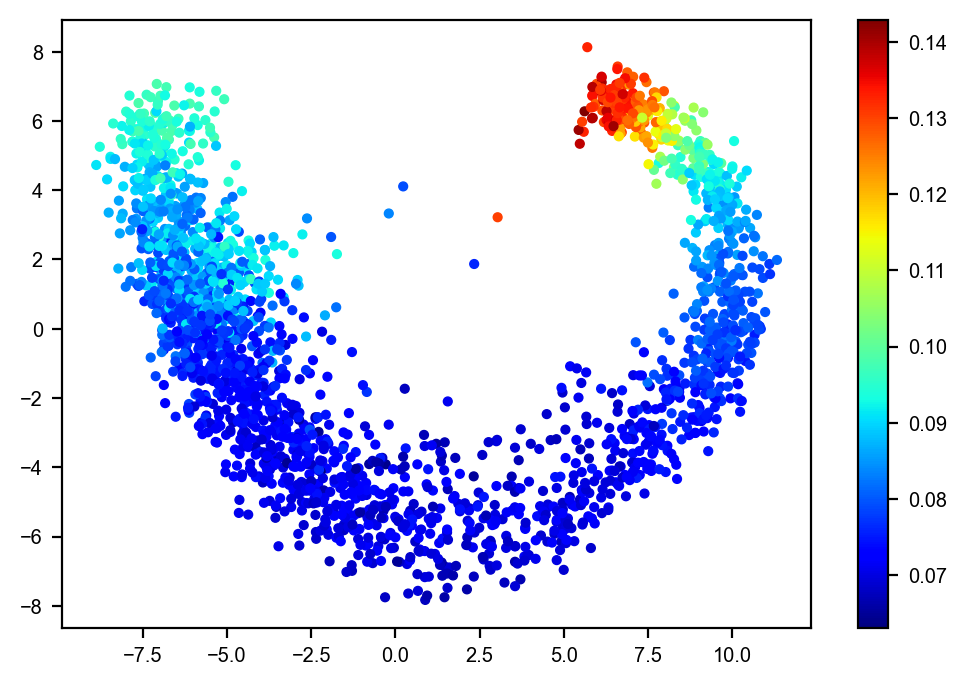

1


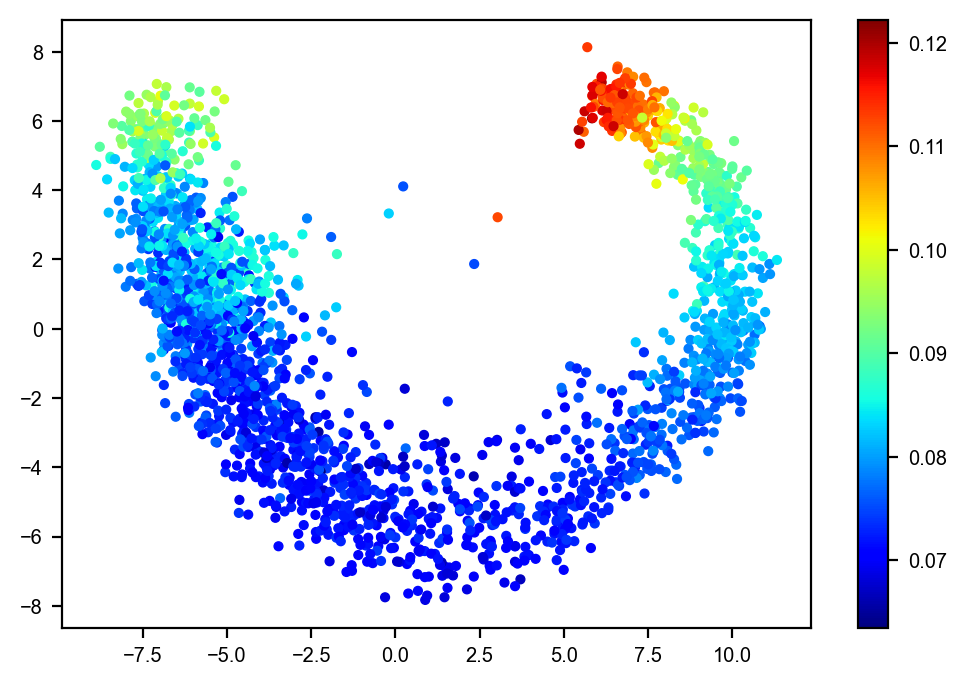

2


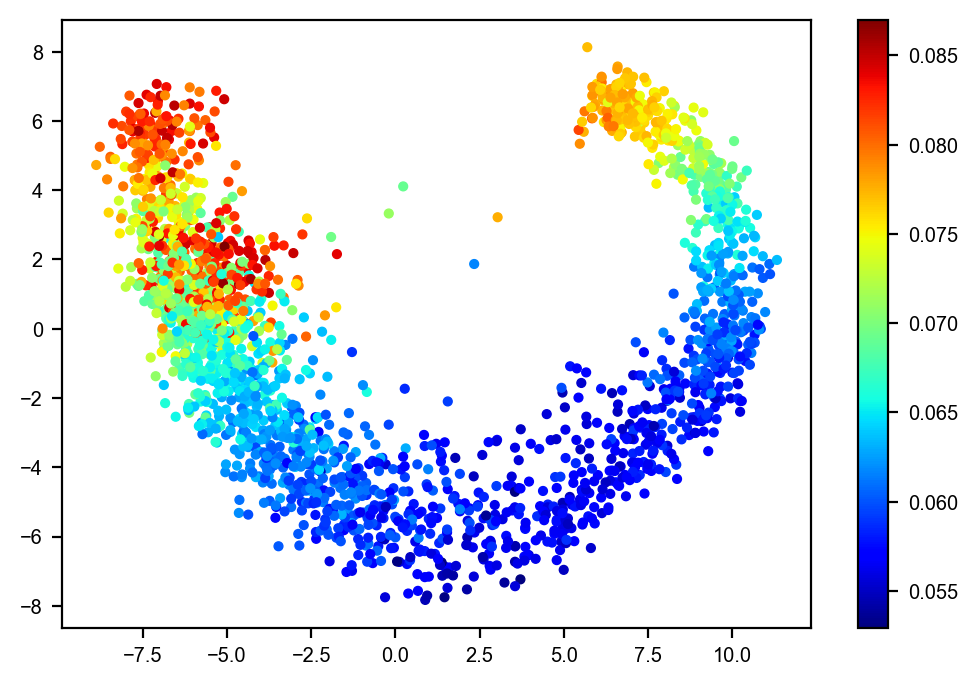

In [19]:
for j in range(L):
    print(j)
    plt.scatter(X_pca[:,0],X_pca[:,1],s=10,c=Fisher_g[:,2*j+1,2*j+1],cmap=plt.cm.jet)
    plt.colorbar()
    plt.show()


In [20]:
def Fisher_dist(mu1,sigma1,mu2,sigma2):
    dim=len(mu1)
    dF2=0
    for i in range(dim):
        a=np.sqrt(((mu1[i]-mu2[i])/np.sqrt(2))**2+(sigma1[i]+sigma2[i])**2)+\
          np.sqrt(((mu1[i]-mu2[i])/np.sqrt(2))**2+(sigma1[i]-sigma2[i])**2)
        b=np.sqrt(((mu1[i]-mu2[i])/np.sqrt(2))**2+(sigma1[i]+sigma2[i])**2)-\
          np.sqrt(((mu1[i]-mu2[i])/np.sqrt(2))**2+(sigma1[i]-sigma2[i])**2)
        
        dF2+=2*(np.log(a/b))**2
    dF=np.sqrt(dF2)
    return dF

In [21]:
def KL_dist(mu1,sigma1,mu2,sigma2):
    dim=len(mu1)
    dmu=mu1-mu2
    KL_dist=0
    for i in range(dim):
        #the after KL_12+KL_21 the log(det(sigma1)/det(sigma2))+log(det(sigma2)/det(sigma1))=0
        # so do not calculate this term
        KL_12=1/2*(-1+sigma1[i]**2/sigma2[i]**2+dmu[i]**2/sigma2[i]**2)
        KL_21=1/2*(-1+sigma2[i]**2/sigma1[i]**2+dmu[i]**2/sigma1[i]**2)
        KL_sym=KL_12+KL_21
        KL_dist+=KL_sym
    return KL_dist

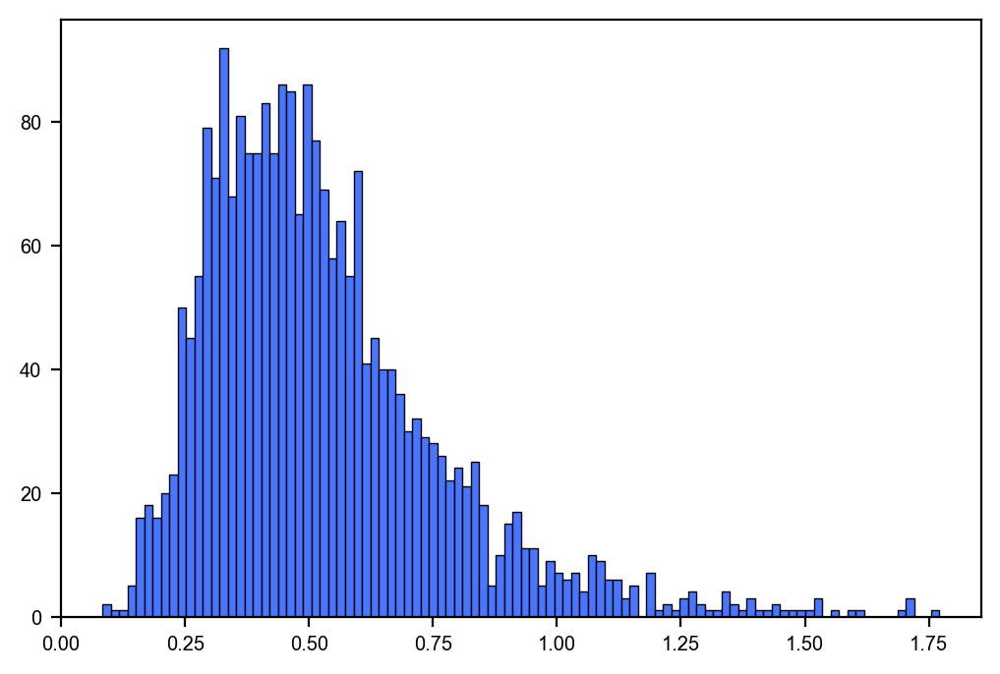

In [22]:
#-------------calcualte distance pair--------------
dist_ratios=[]
for inds in np.split(A.indices, A.indptr)[1:-1]:

    dist_r=[]
    self_ind=inds[0]
    for nei_k in range(1,len(inds)):
        
        dEu=np.linalg.norm(X[self_ind,:]-X[inds[nei_k],:])
        dFi=Fisher_dist(X_mu[self_ind,:],X_sigma[self_ind,:],\
                        X_mu[inds[nei_k],:],X_sigma[inds[nei_k],:])

        gau_dEu=np.linalg.norm(X_mu[self_ind,:]-X_mu[inds[nei_k],:])
        
        dKL=KL_dist(X_mu[self_ind,:],X_sigma[self_ind,:],\
                        X_mu[inds[nei_k],:],X_sigma[inds[nei_k],:])
        
        dist_r.append(dEu/dFi)

        
        
#     print(np.std(dist_r)/np.mean(dist_r))
    
    dist_ratios.append(np.std(dist_r)/np.mean(dist_r))

plt.hist(np.array(dist_ratios),bins=100,edgecolor='black')
plt.show()

In [23]:
def wasserstein_distance(mu1,sigma1,mu2,sigma2):
    dim=len(mu1)
    dmu=mu1-mu2
    W_dist2=0
    for i in range(dim):
        W_dist2+=dmu[i]**2+sigma1[i]**2+sigma2[i]**2-2*np.sqrt(sigma2[i]*sigma1[i]**2*sigma2[i])
    W_dist=np.sqrt(W_dist2)
    return W_dist

In [78]:
eRc_arr=[]
eRc_pos=[]
cRc_arr=[]
for inds in np.split(A.indices, A.indptr)[1:-1]:

    self_ind=inds[0]
    cRc=0
    eRc=0
    for nei_k in range(1,len(inds)):
        
        dEu=np.linalg.norm(X[self_ind,:]-X[inds[nei_k],:])
        dFi=Fisher_dist(X_mu[self_ind,:],X_sigma[self_ind,:],\
                        X_mu[inds[nei_k],:],X_sigma[inds[nei_k],:])
        dWa=wasserstein_distance(X_mu[self_ind,:],X_sigma[self_ind,:],\
                        X_mu[inds[nei_k],:],X_sigma[inds[nei_k],:])
        
        eRc_arr.append(1-dWa/dEu)
        eRc_pos.append((X_pca[self_ind,:]+X_pca[inds[nei_k],:])/2)
        
        cRc+=(1-dWa/dEu)
    
    cRc_arr.append(cRc/len(inds))
#     cRc_arr.append(cRc)

(20898,) (20898, 20)


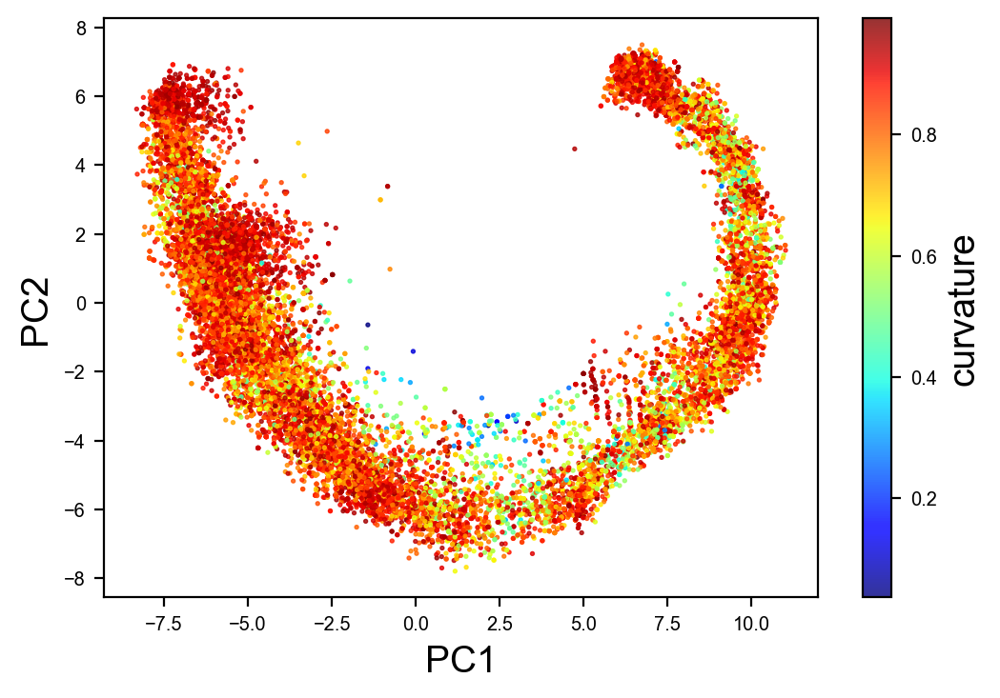

In [79]:
eRc_arr=np.array(eRc_arr)
eRc_pos=np.array(eRc_pos)
cRc_arr=np.array(cRc_arr)
print(eRc_arr.shape,eRc_pos.shape)
plt.scatter(eRc_pos[:,0],eRc_pos[:,1], c=eRc_arr, s=2, alpha=0.8,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)

clb=plt.colorbar()

clb.ax.set_ylabel('curvature',fontsize=14)
plt.savefig(result_path+'EG_edge_curvature.png')
plt.show()

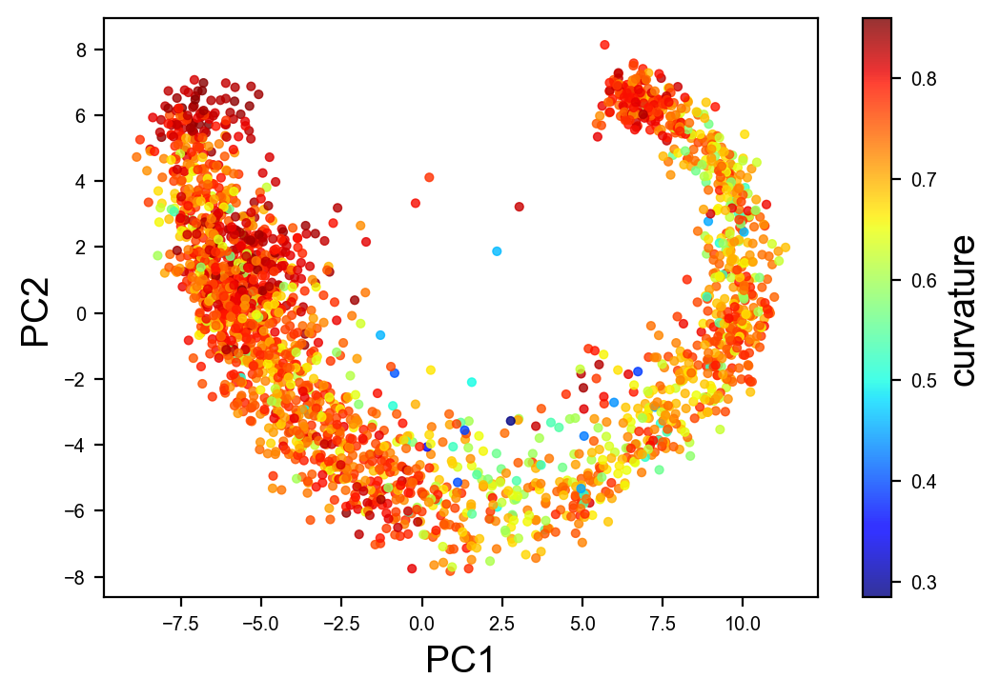

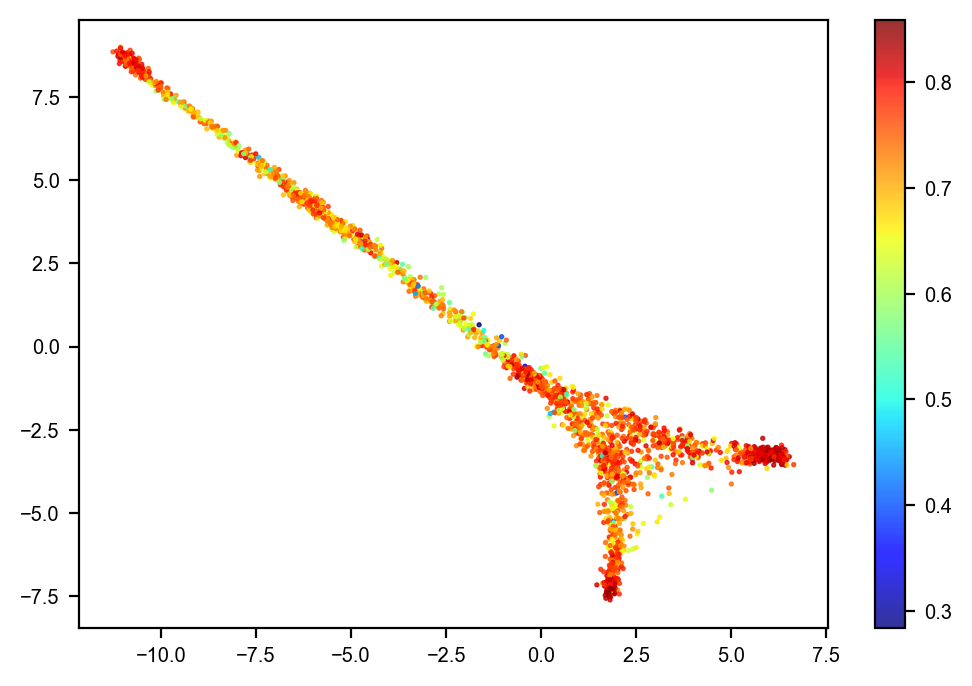

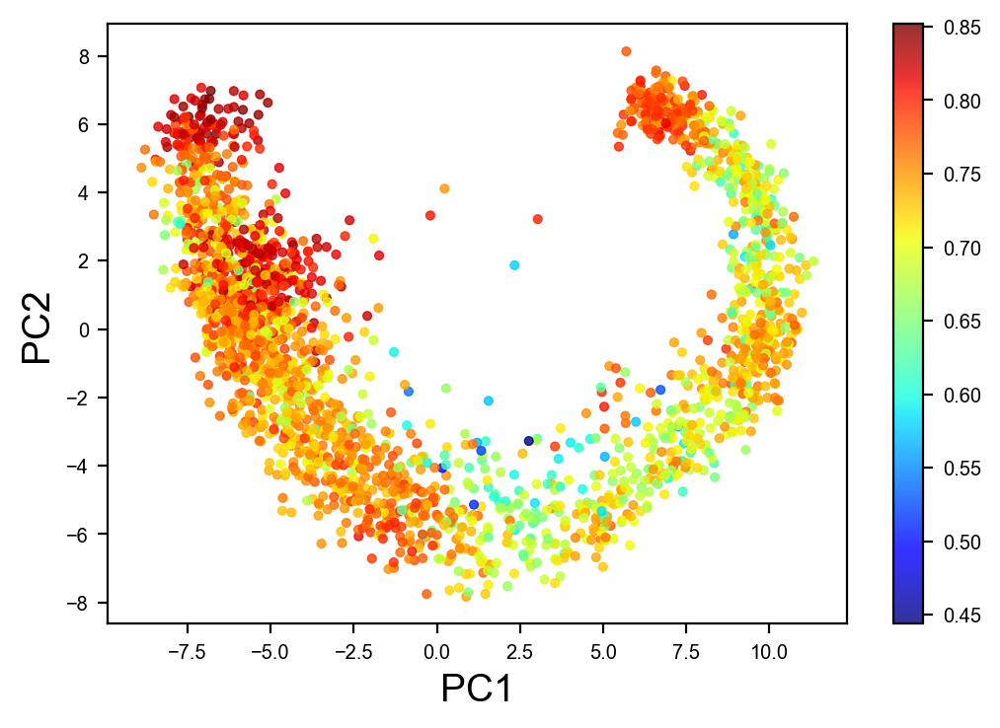

In [80]:
plt.scatter(X_pca[:,0],X_pca[:,1], c=cRc_arr, s=10, alpha=0.8,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)

clb=plt.colorbar()

clb.ax.set_ylabel('curvature',fontsize=14)
plt.savefig(result_path+'EG_curvature.png')
plt.show()

plt.scatter(X_mu[:,0],X_mu[:,1], c=cRc_arr, s=2, alpha=0.8,cmap=plt.cm.jet)
plt.colorbar()
plt.show()


cRc_smooth=cRc_arr.copy()
for ci in range(len(cRc_arr)):
    cRc_smooth[ci]=np.dot(cRc_arr[cell_nei[ci,:]],nei_w[ci,:])
    
    
plt.scatter(X_pca[:,0],X_pca[:,1], c=cRc_smooth, s=10, alpha=0.8,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
plt.colorbar()
plt.show()

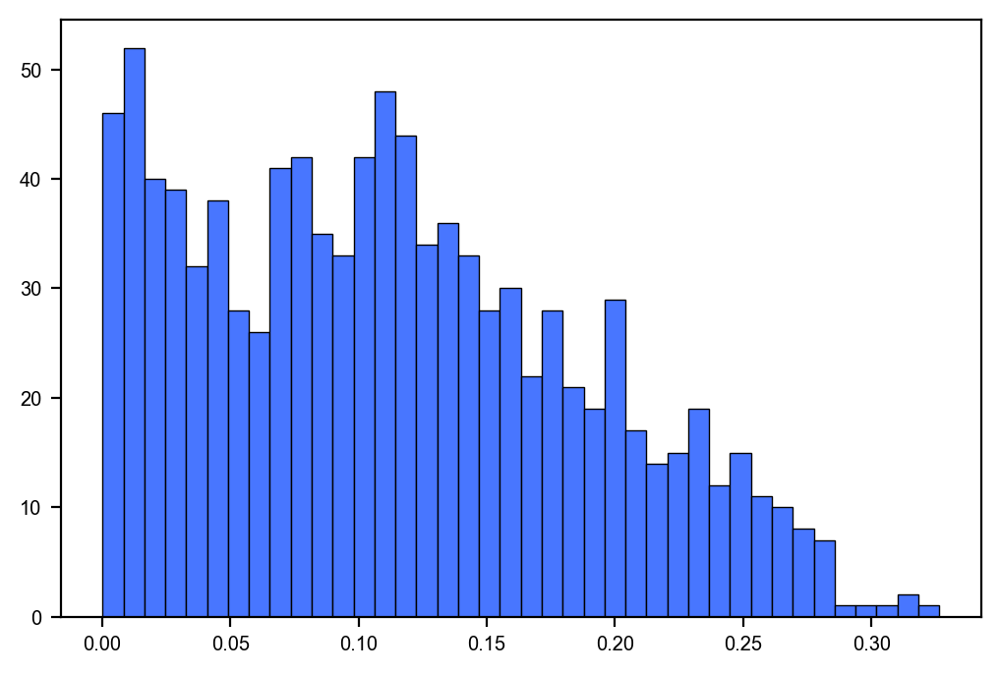

In [28]:
cRc_gene_corr=[]
for gi in range(Xs.shape[1]):
#     print(np.corrcoef(Xs[:,gi],cRc_arr))
    cRc_gene_corr.append(np.corrcoef(Xs[:,gi],cRc_arr)[0,1])
plt.hist(np.abs(cRc_gene_corr),bins=40,edgecolor='k')
plt.show()

# cRc_keygene=gene_arr[np.abs(cRc_gene_corr)>0.5]
# print(cRc_keygene)

# for kg in cRc_keygene:
#     scv.pl.scatter(adata, basis='pca', color=kg,colorbar=True)

In [29]:
# scv.pl.velocity_embedding(adata, basis='pca',color='label_time',arrow_length=3, arrow_size=2)

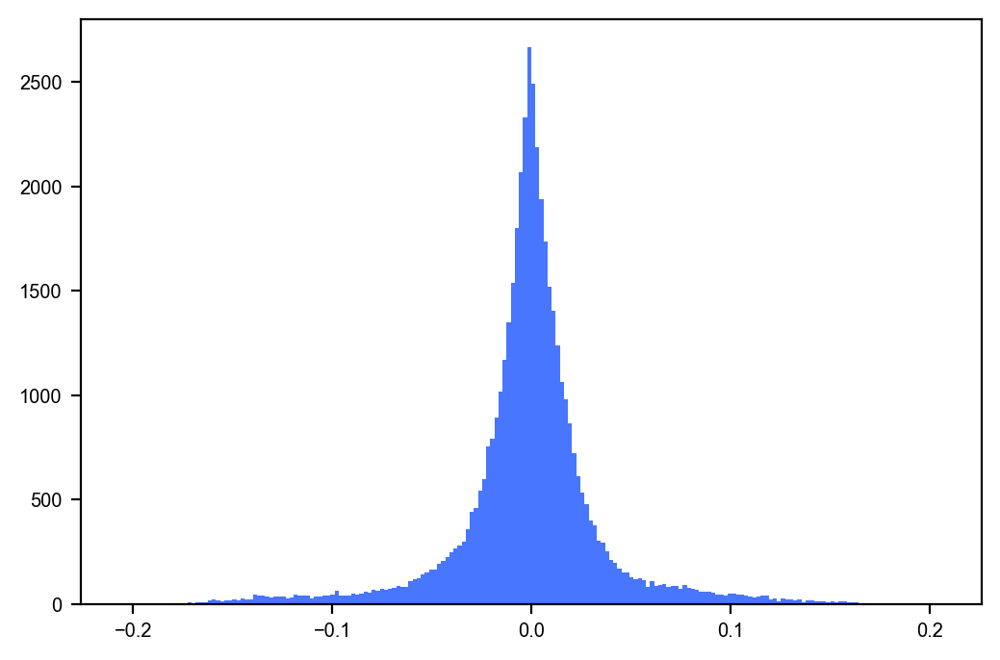

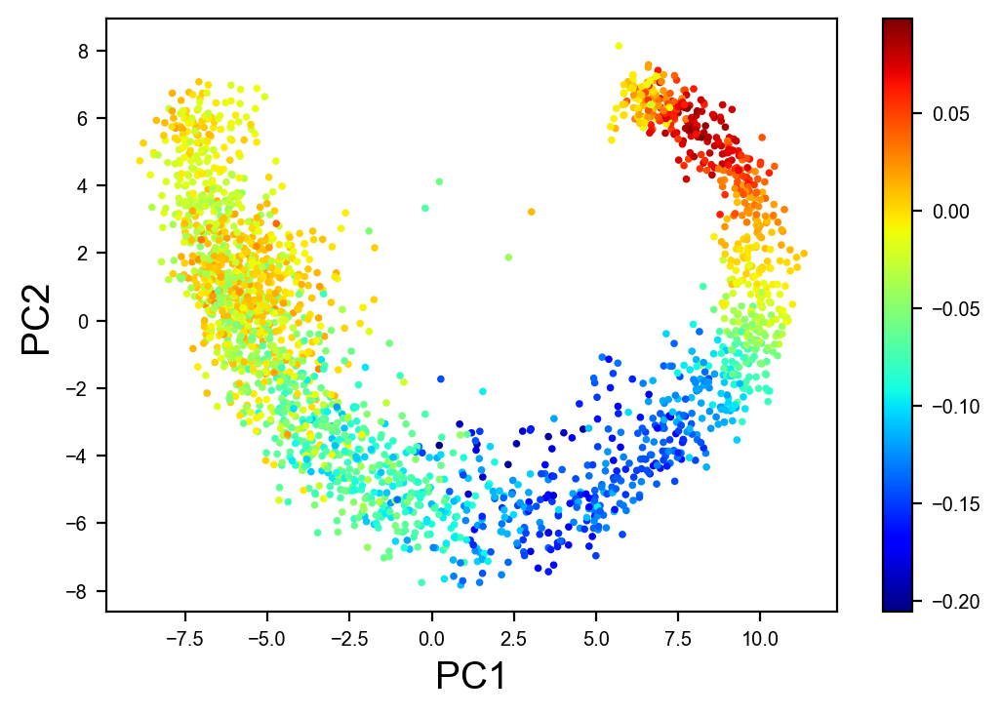

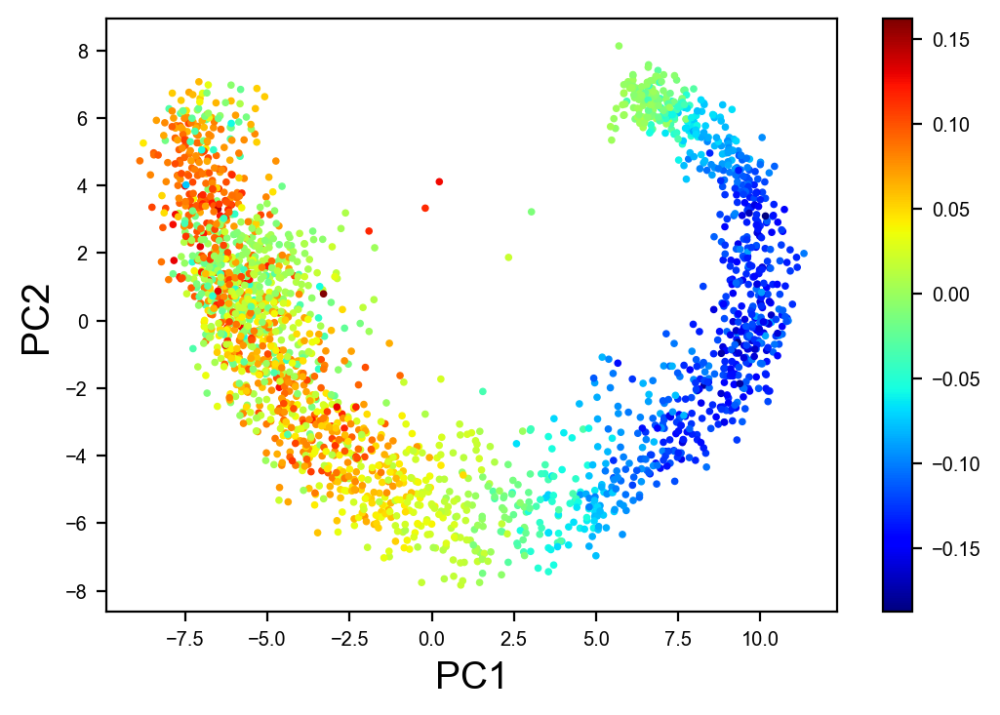

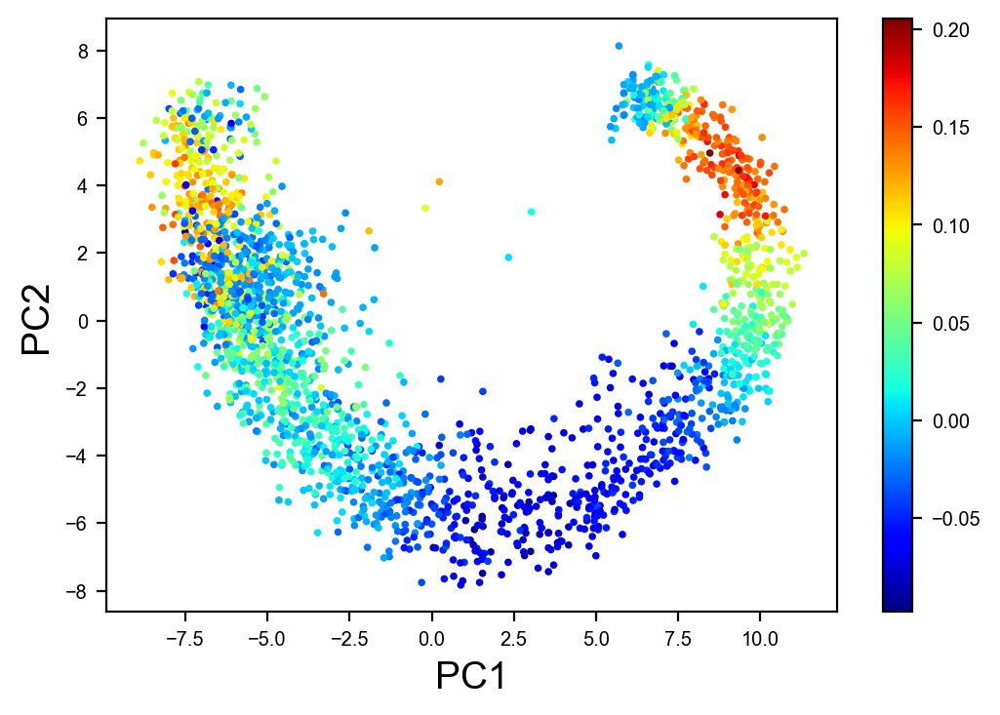

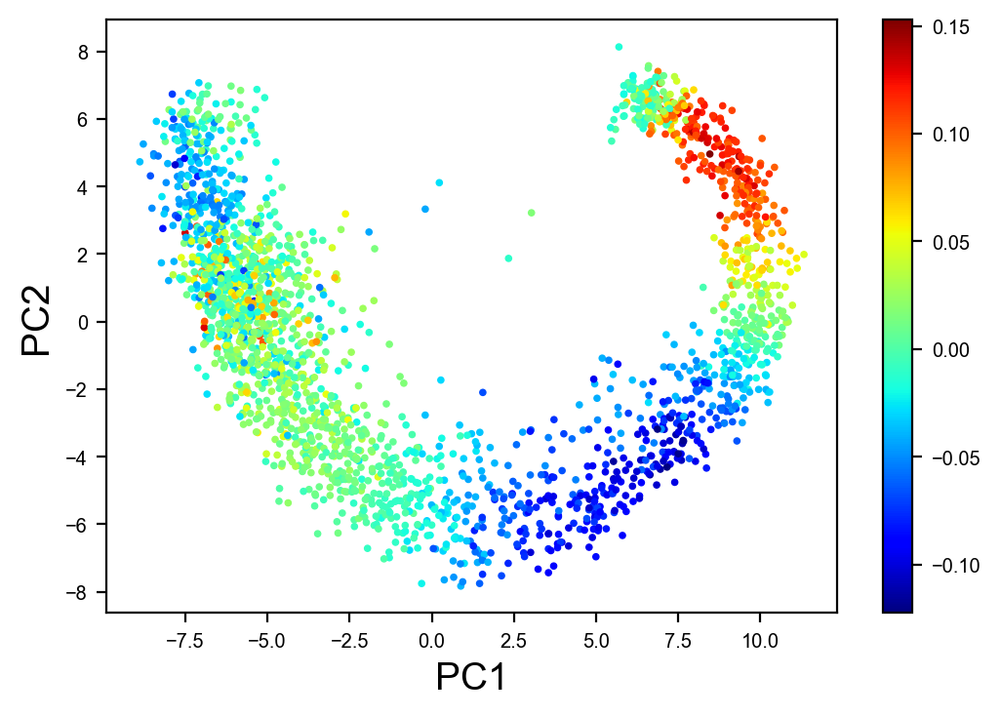

...

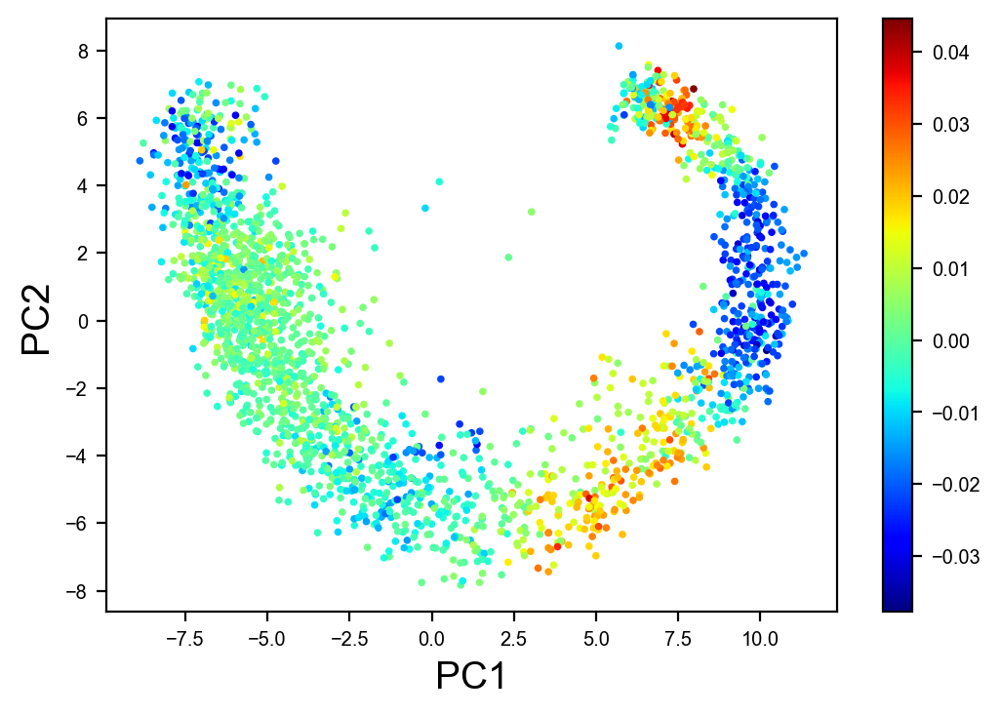

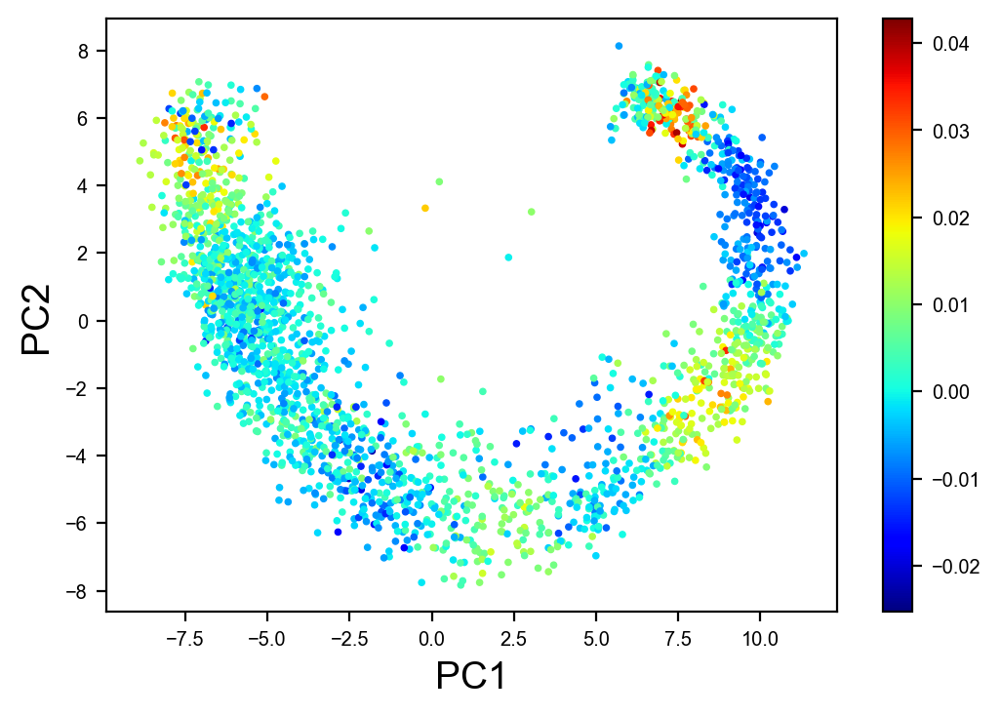

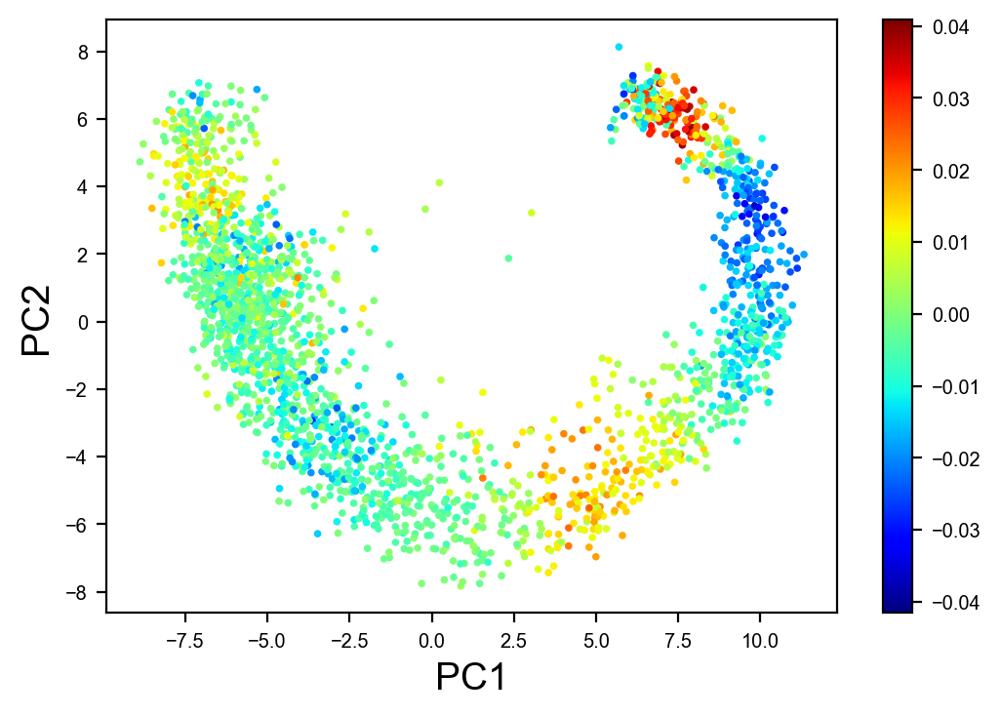

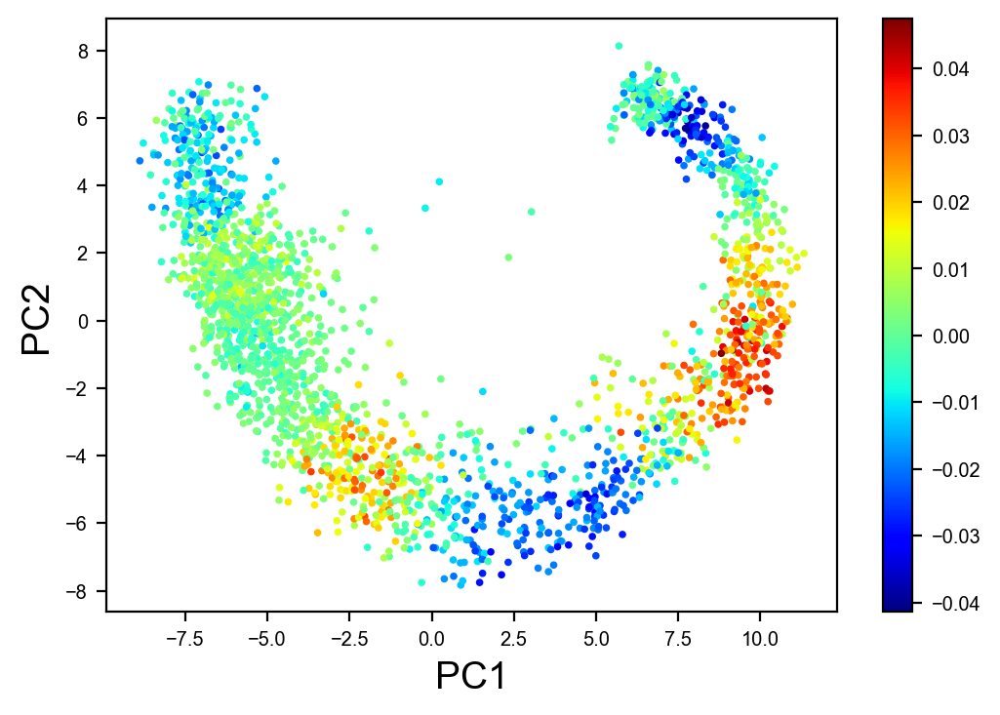

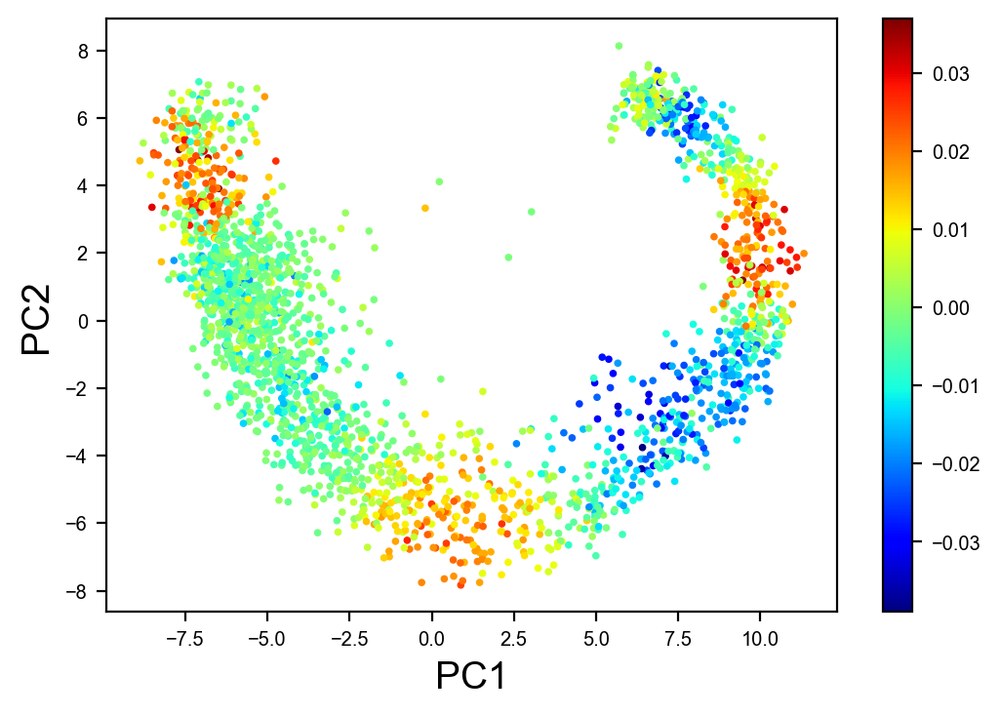

In [30]:
#------using velocity_pca to calculate dmu/dt and dsigma/dt
pca_dim=20
velo=adata.obsm['velocity_pca'][:,:pca_dim]#np.array(adata.layers['velocity'])
#velo=velo/np.std(np.abs(velo),axis=0)#
# plt.hist(velo.flatten(),bins=200)
# plt.show()
X=X_pca[:,:pca_dim]#scaler.fit_transform(Xs)#[:,adata.var['velocity_genes'].values]
for k in range(pca_dim):
    plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=velo[:,k],cmap=plt.cm.jet)
    plt.xlabel('PC1',fontsize=14)
    plt.ylabel('PC2',fontsize=14)

    clb=plt.colorbar()

    plt.show()

In [31]:
# #------------use RKHS to obtain the dmu/dt and dsigma/dt

# # vec_F=SparseVFC(X,latent_z,Grid=X)
# # pLz_pX=Jacobian_rkhs_gaussian(X, vec_F)
# # pLz_pX=np.transpose(np.array(pLz_pX),[2,0,1])
# # pLz_pX.shape

# vec_Mu=SparseVFC(X,X_mu,Grid=X)
# pMu_pX=Jacobian_rkhs_gaussian(X, vec_Mu)
# pMu_pX=np.transpose(np.array(pMu_pX),[2,0,1])
# vec_Sgm=SparseVFC(X,X_sigma,Grid=X)
# pSgm_pX=Jacobian_rkhs_gaussian(X, vec_Sgm)
# pSgm_pX=np.transpose(np.array(pSgm_pX),[2,0,1])

# mu_velo = np.array([pMu_pX[i]@velo[i] for i in range(X.shape[0])])
# sgm_velo = np.array([pSgm_pX[i]@velo[i] for i in range(X.shape[0])])
# zv2 = np.zeros(X.shape[0])
# for i in range(X.shape[0]):
#     for j in range(L):
#         zv2[i] += Fisher_g[i,2*j,2*j]*mu_velo[i,j]**2 + Fisher_g[i,2*j+1,2*j+1]*sgm_velo[i,j]**2
# zv1 = np.sqrt(zv2)

# plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=np.linalg.norm(np.hstack((mu_velo,sgm_velo)),axis=1),cmap=plt.cm.jet)
# plt.xlabel('PC1',fontsize=14)
# plt.ylabel('PC2',fontsize=14)

# clb=plt.colorbar()

# plt.show()
# for k in range(L):
#     plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=mu_velo[:,k],cmap=plt.cm.jet)
#     plt.xlabel('PC1',fontsize=14)
#     plt.ylabel('PC2',fontsize=14)
#     clb=plt.colorbar()
#     plt.show()

#     plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=sgm_velo[:,k],cmap=plt.cm.jet)
#     plt.xlabel('PC1',fontsize=14)
#     plt.ylabel('PC2',fontsize=14)
#     clb=plt.colorbar()
#     plt.show()

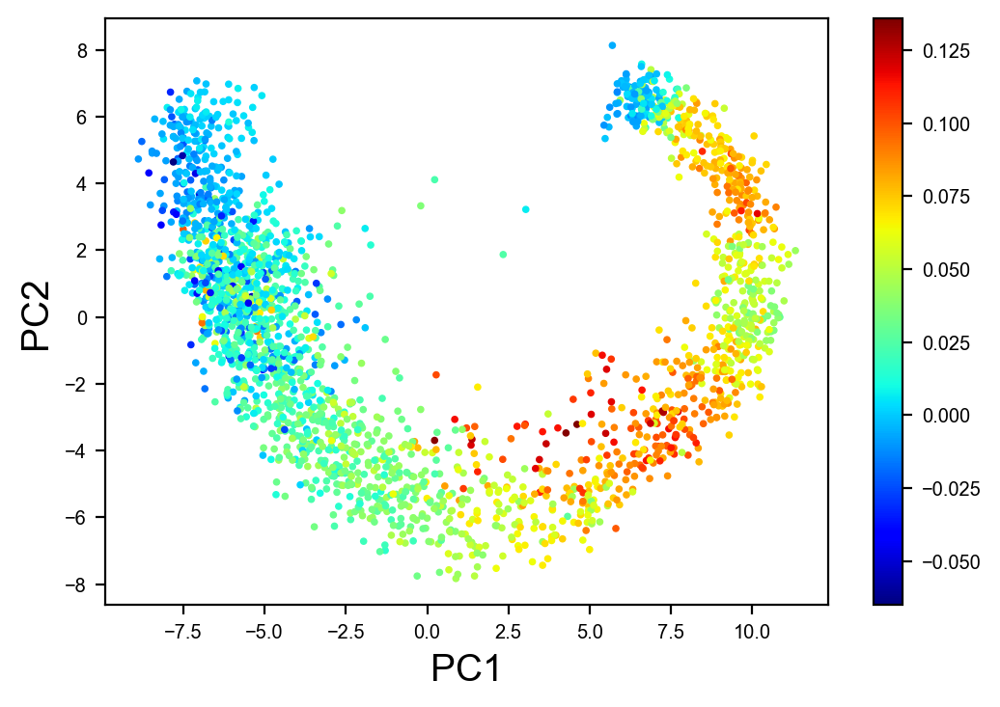

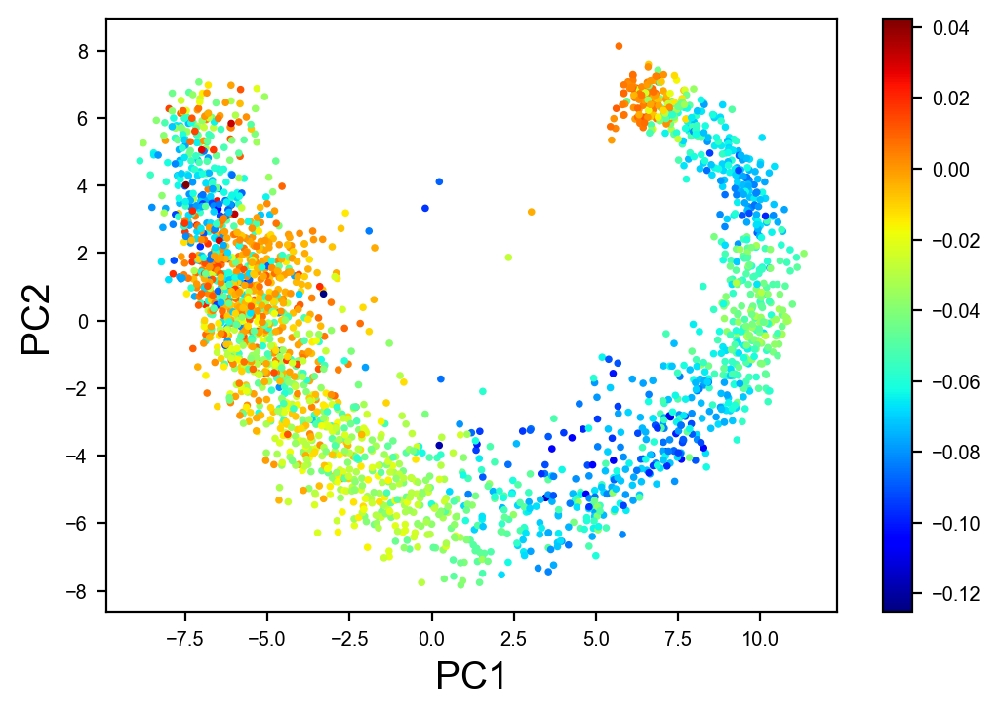

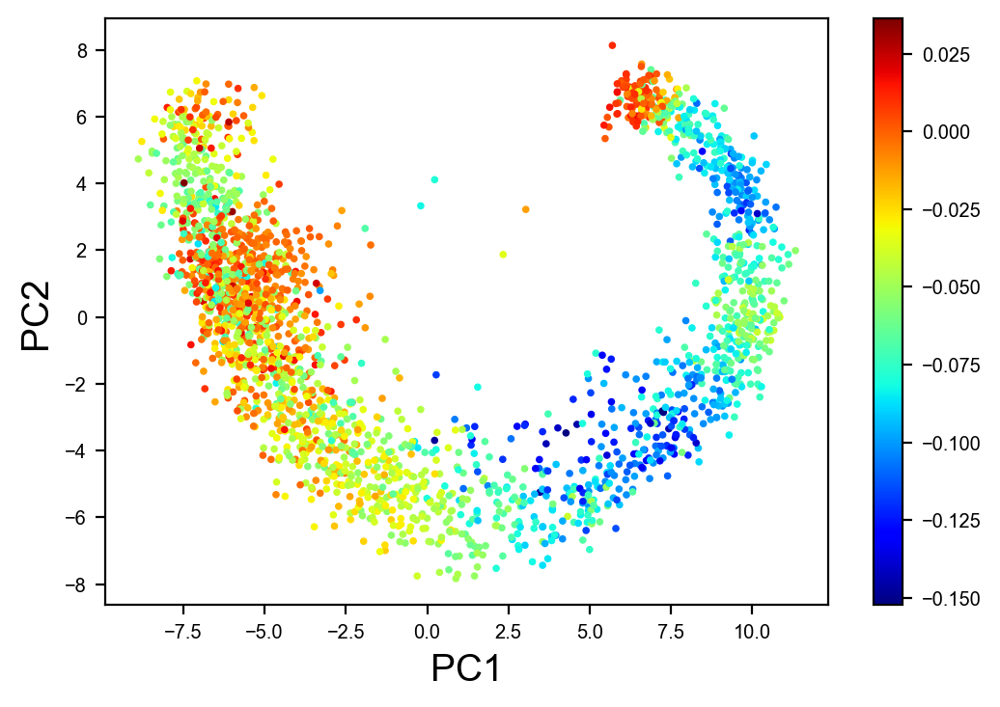

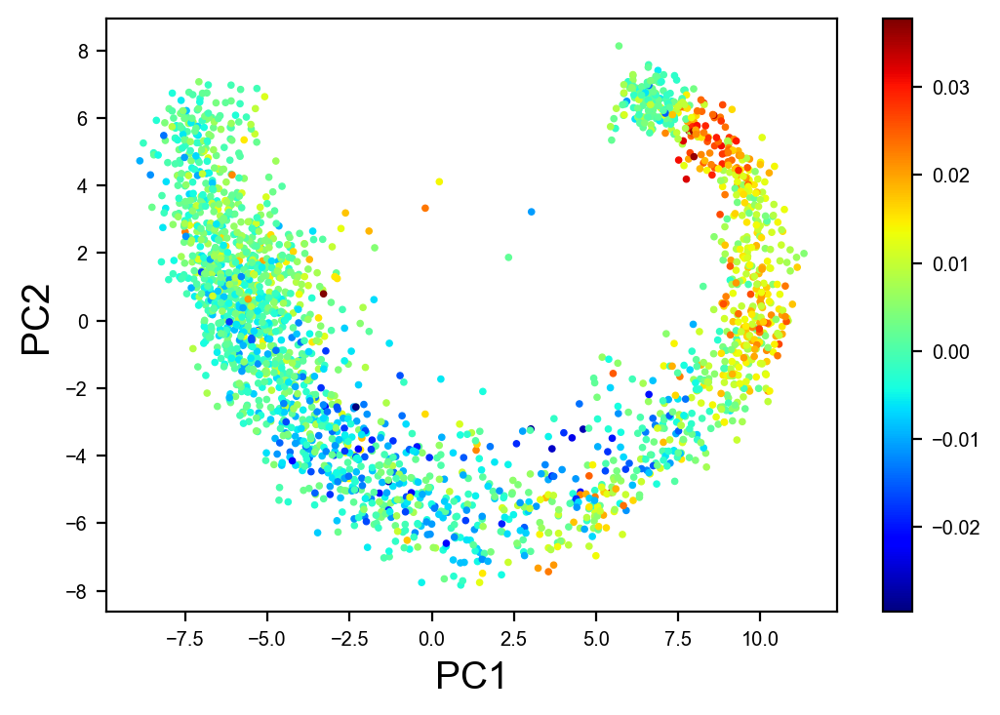

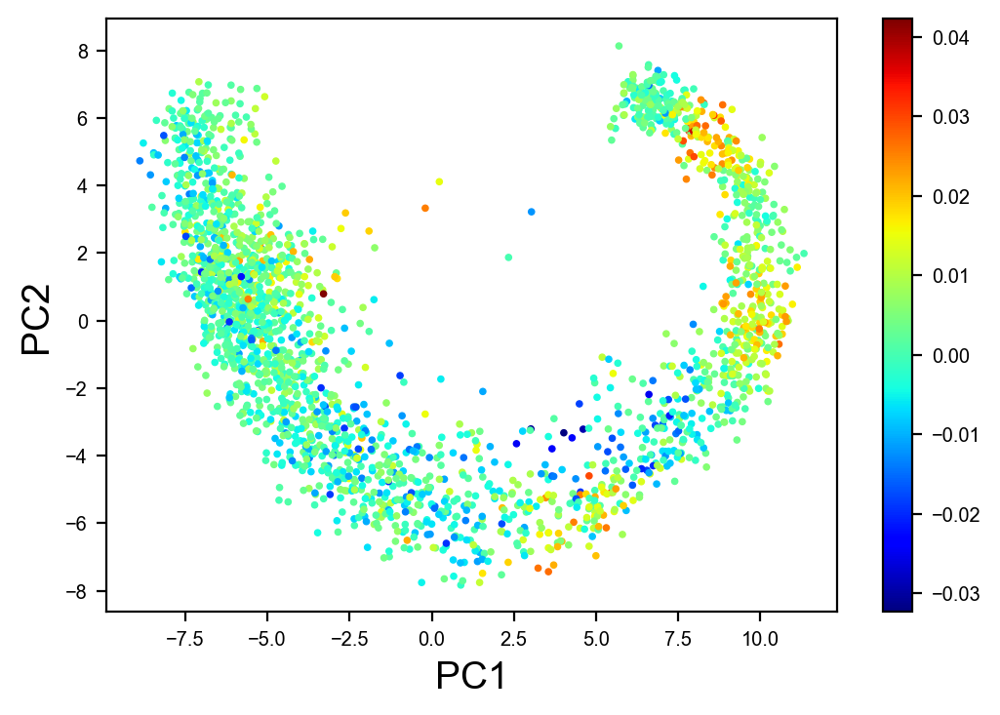

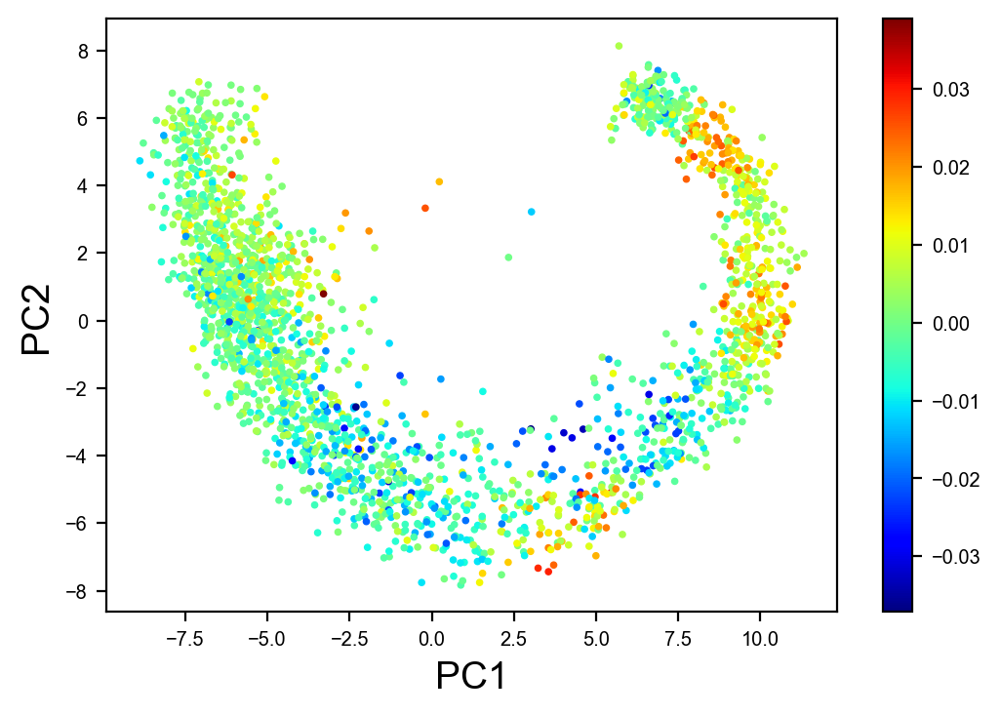

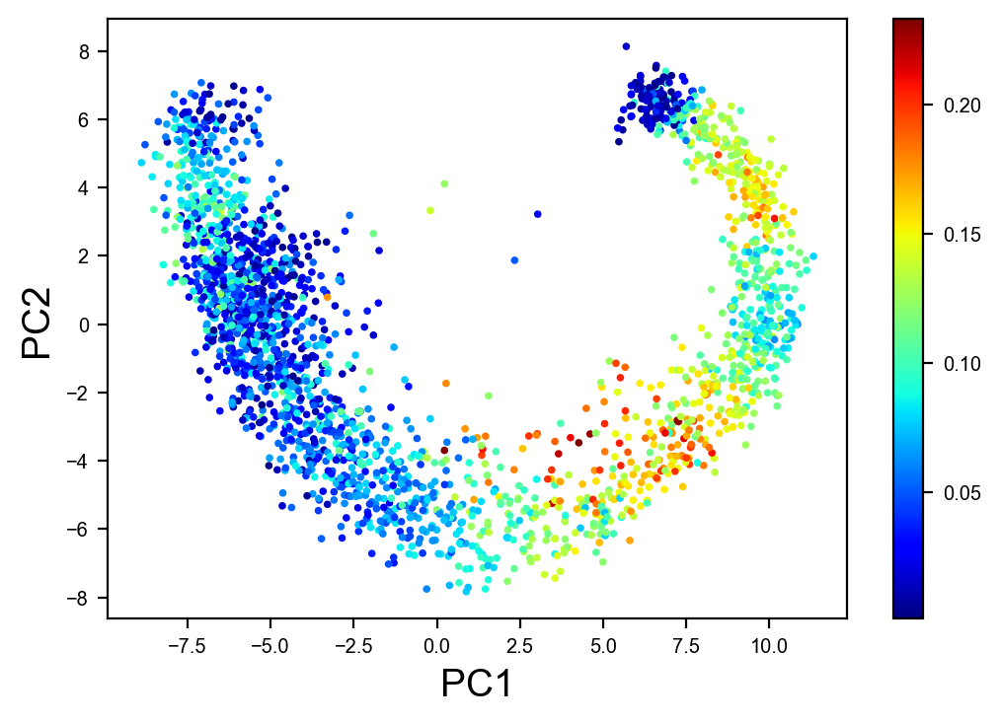

In [42]:
#------use a simple neural network to study dmu/dt and dsigma/dt

model = nn.Sequential(
    nn.Linear(X.shape[1], 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = SGD(model.parameters(), lr=0.01, weight_decay=0.001)#, momentum=0.2

x_in=torch.tensor(X)
x_out=torch.tensor(latent_z)
# Train the model
for epoch in range(500):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()


pZ_pX = np.zeros([X.shape[0], L*2, X.shape[1]])

# Compute the gradients
for i in range(X.shape[0]):
    x0=torch.tensor(X[i,:],requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pZ_pX[i,j,:] = x0.grad.detach()


Z_velo = np.array([pZ_pX[i]@velo[i] for i in range(X.shape[0])])

zv2 = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    for j in range(L):
        zv2[i] += Fisher_g[i,2*j,2*j]*Z_velo[i,2*j]**2 + Fisher_g[i,2*j+1,2*j+1]*Z_velo[i,2*j+1]**2
zv1 = np.sqrt(zv2)

for k in range(2*L):
    plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=Z_velo[:,k],cmap=plt.cm.jet)
    plt.xlabel('PC1',fontsize=14)
    plt.ylabel('PC2',fontsize=14)

    clb=plt.colorbar()

    plt.show()
    
plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=np.linalg.norm(Z_velo,axis=1),cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)

clb=plt.colorbar()

plt.show()

In [43]:
#------using the Gaussian embedding network to get dmu/dt and dsigma/dt, directly using dX/dt make 
#-----the results unstable

# def Jacobian_nn(x0,d,encoder):
#     x = torch.tensor(x0,requires_grad=True)
#     z = encoder(x)
#     pMu_pX = np.zeros([d,x0.shape[0]])
#     pSgm_pX = np.zeros([d,x0.shape[0]])
#     for i in range(d):
#         x.grad = None
#         z[0][i].backward(retain_graph=True)
#         pMu_pX[i] = x.grad.detach()
#         x.grad = None
#         z[1][i].backward(retain_graph=True)
#         pSgm_pX[i] = x.grad.detach()
#     return pMu_pX,pSgm_pX

# pMu_pX = np.zeros([X.shape[0],L,X.shape[1]])
# pSgm_pX = np.zeros([X.shape[0],L,X.shape[1]])
# for i in range(X.shape[0]):
#     pMu_pX[i],pSgm_pX[i] = Jacobian_nn(X[i],L,encoder)

# Fisher_g=np.zeros((X.shape[0],L*2,L*2))
# for i in range(X.shape[0]):
#     for j in range(L):
#         Fisher_g[i,2*j,2*j]=1/sigma_learned[i,j]**2
#         Fisher_g[i,2*j+1,2*j+1]=2/sigma_learned[i,j]**2

# mu_velo = np.array([pMu_pX[i]@velo[i] for i in range(X.shape[0])])
# sgm_velo = np.array([pSgm_pX[i]@velo[i] for i in range(X.shape[0])])
# zv2 = np.zeros(X.shape[0])
# for i in range(X.shape[0]):
#     for j in range(L):
#         zv2[i] += Fisher_g[i,2*j,2*j]*mu_velo[i,j]**2 + Fisher_g[i,2*j+1,2*j+1]*sgm_velo[i,j]**2
# zv1 = np.sqrt(zv2)

In [44]:
zv1_smooth=smooth_func(zv1,cell_nei,nei_w)
# zv1_smooth=zv1.copy()
# for ci in range(len(zv1)):
#     zv1_smooth[ci]=np.dot(zv1[cell_nei[ci,:]],nei_w[ci,:])

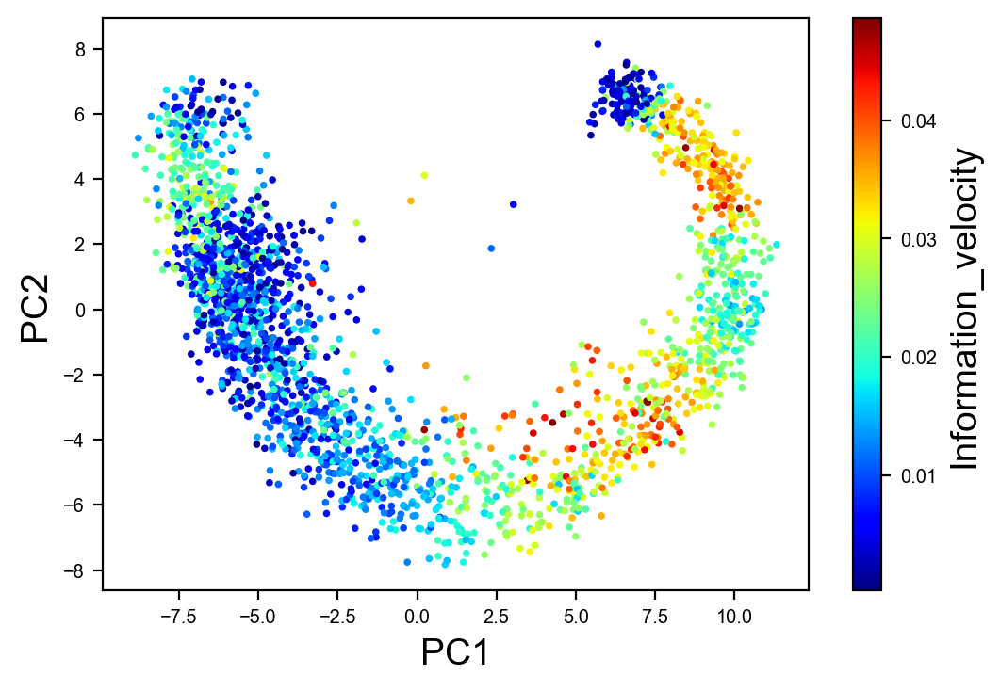

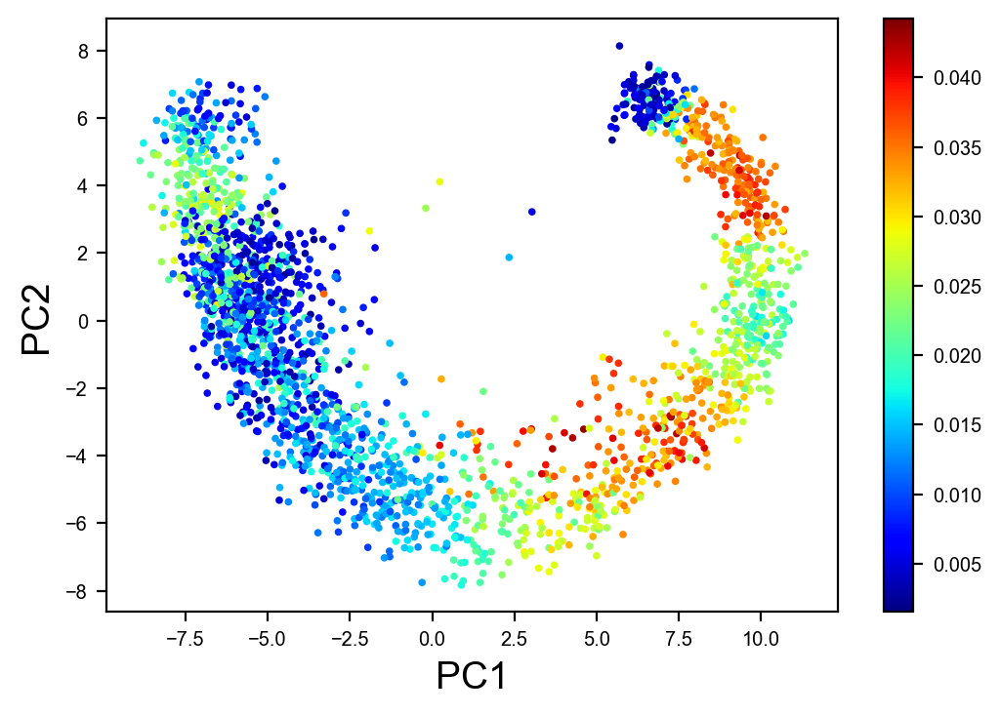

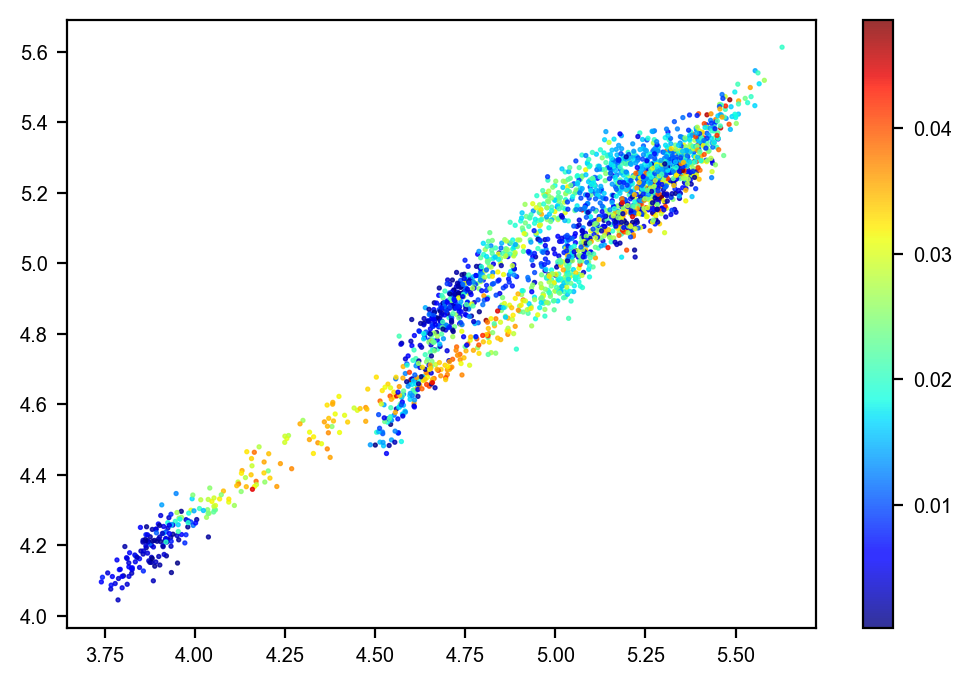

In [45]:
plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=zv1,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)

clb=plt.colorbar()

clb.ax.set_ylabel('Information_velocity',fontsize=14)
plt.savefig(result_path+'DG_info_velo.png')
plt.show()




plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=zv1_smooth,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
plt.colorbar()
plt.show()

plt.scatter(X_sigma[:,0],X_sigma[:,1], c=zv1, s=2, alpha=0.8,cmap=plt.cm.jet)
plt.colorbar()
plt.show()

In [46]:
from sklearn.metrics import mutual_info_score
from scipy.stats import chi2_contingency

def calc_MI(x, y, bins):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

# def calc_MI(x, y, bins):
#     c_xy = np.histogram2d(x, y, bins)[0]
#     g, p, dof, expected = chi2_contingency(c_xy, lambda_="log-likelihood")
#     mi = 0.5 * g / c_xy.sum()
#     return mi
print(calc_MI(cRc_arr,zv1,bins=40))

mine=MINE(alpha=0.6, c=15)
mine.compute_score(cRc_arr,zv1)
mine.mic()

0.2991992573460902


0.1860032031666603

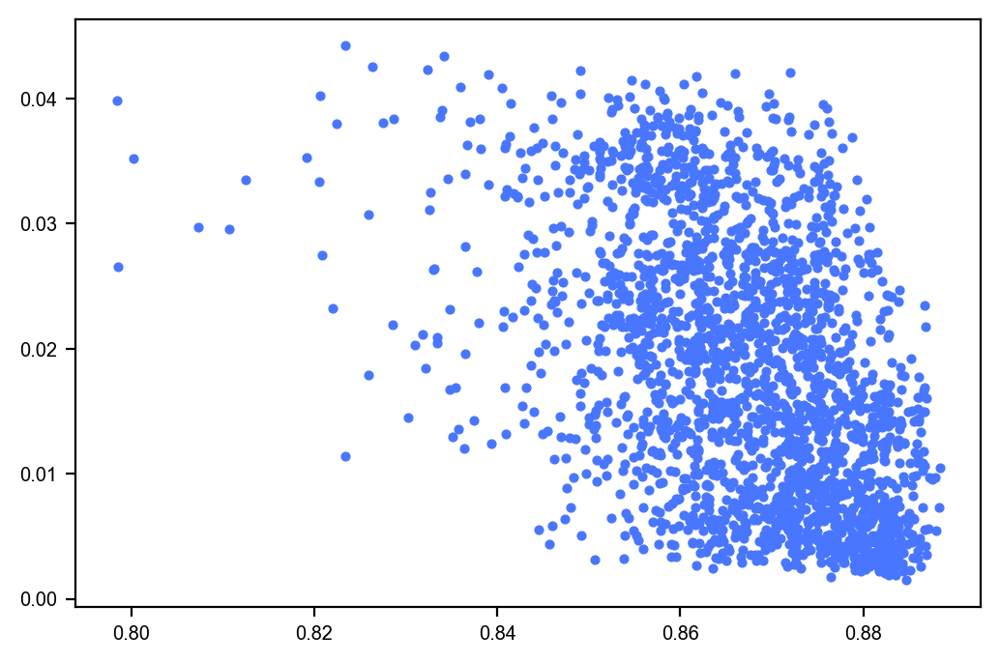

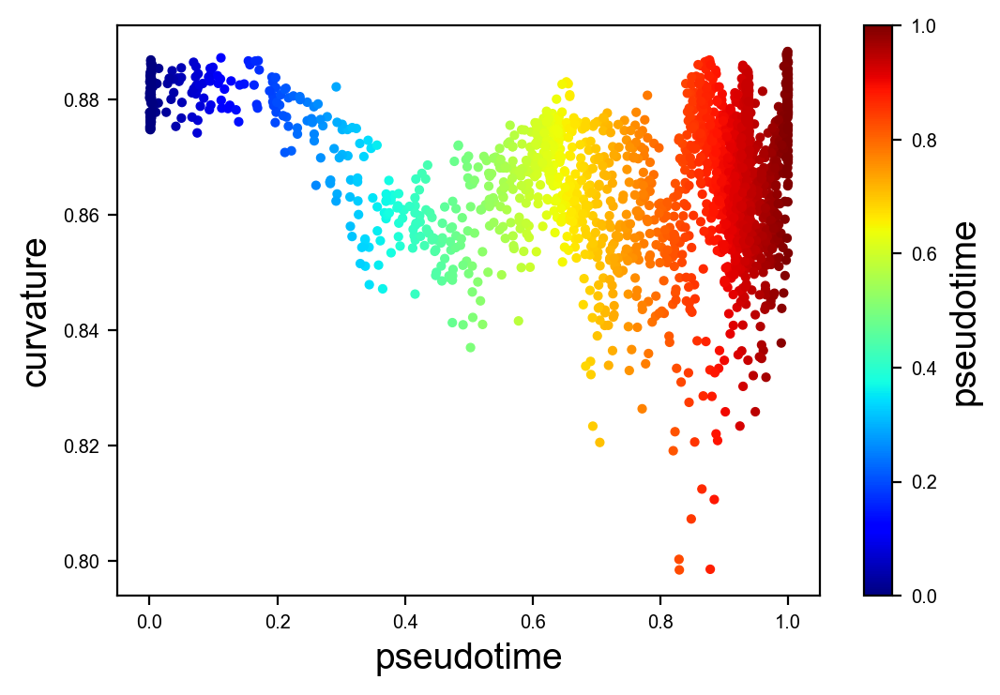

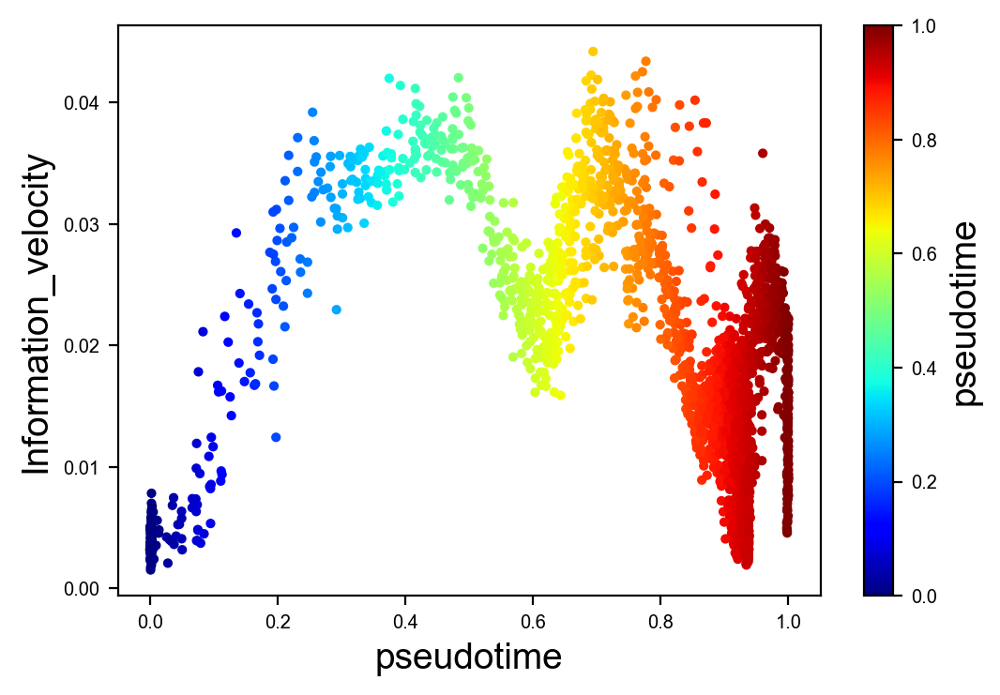

In [47]:
plt.scatter(cRc_smooth,zv1_smooth,s=10)
plt.show()

plt.scatter(cell_vpt,cRc_smooth,c=cell_vpt,s=10,cmap=plt.cm.jet)
plt.xlabel('pseudotime',fontsize=14)
plt.ylabel('curvature',fontsize=14)
clb=plt.colorbar()

clb.ax.set_ylabel('pseudotime',fontsize=14)
plt.savefig(result_path+'DG_vpt_cur.png')
plt.show()

plt.scatter(cell_vpt,zv1_smooth,c=cell_vpt,s=10,cmap=plt.cm.jet)

plt.xlabel('pseudotime',fontsize=14)
plt.ylabel('Information_velocity',fontsize=14)
clb=plt.colorbar()

clb.ax.set_ylabel('pseudotime',fontsize=14)
plt.savefig(result_path+'DG_vpt_iv.png')
plt.show()

In [48]:
# iv_gene_corr=[]
# for gi in range(Xs.shape[1]):
# #     print(np.corrcoef(Xs[:,gi],cRc_arr))
#     iv_gene_corr.append(np.corrcoef(Xs[:,gi],zv1)[0,1])
# #     iv_gene_corr.append(calc_MI(Xs[:,gi],zv1,bins=100))
# #     mine.compute_score(Xs[:,gi],zv1)
# #     iv_gene_corr.append(mine.mic())
# plt.hist(np.abs(iv_gene_corr),bins=50,edgecolor='k')
# plt.show()

# iv_keygene=gene_arr[np.abs(iv_gene_corr)>0.7]
# print(iv_keygene)

# for kg in iv_keygene:
#     scv.pl.scatter(adata, basis='pca', color=kg,colorbar=True)
# #     plt.savefig(result_path+'DG'+kg+'.png')
# # plt.show()

In [49]:
#-----------entropy-----------------

In [50]:
Info_entropy=np.log(np.array([np.prod(X_sigma[i,:]**2) for i in range(Fisher_g.shape[0])]))

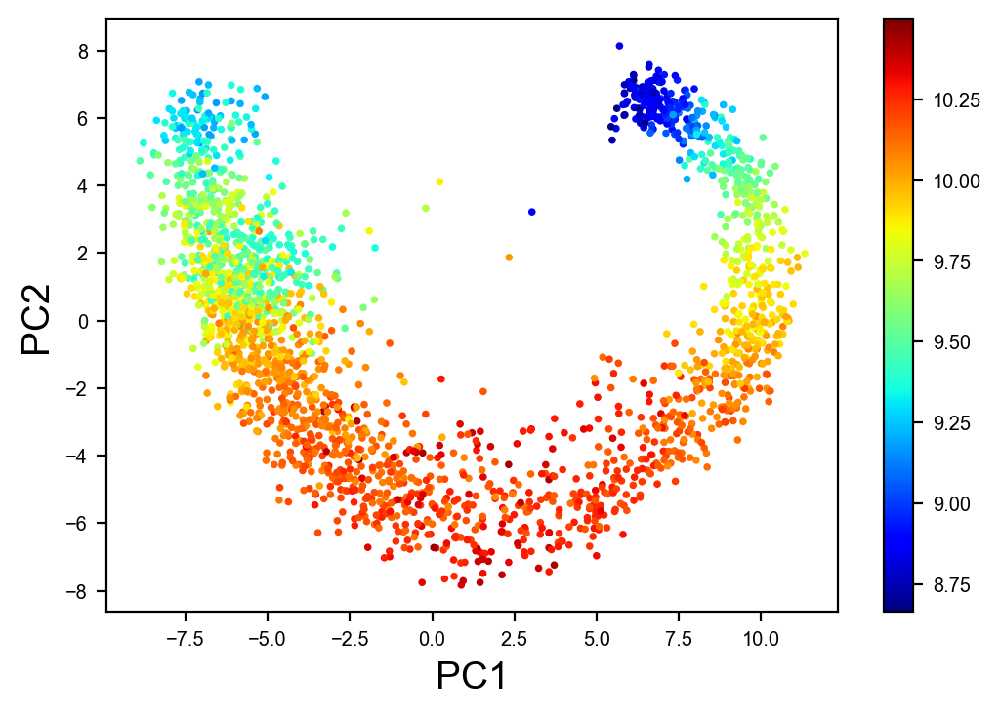

In [51]:
plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=Info_entropy,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
plt.colorbar()
plt.show()

In [52]:
#---------------fisher info on pca


In [54]:
# from sklearn.decomposition import PCA

pca_dim=15
# pca_model=PCA(n_components=pca_dim).fit(X)
X_pca=adata.obsm['X_pca'][:,:pca_dim]#pca_model.transform(Xs)

In [56]:
velo_pca=adata.obsm['velocity_pca'][:,:pca_dim]#np.matmul(velo,pca_model.components_.T)#

In [46]:

# vec_F=SparseVFC(X_pca,latent_z,Grid=X_pca)
# pMu_pPc=Jacobian_rkhs_gaussian(X_pca, vec_F)
# pMu_pPc=np.transpose(np.array(pMu_pPc),[2,0,1])

# # pMu_pPc= np.zeros([X.shape[0],pca_dim,L*2])
# # for di in range(latent_z.shape[1]):
# #     vec_F=SparseVFC(X_pca,latent_z[:,di][:,None],Grid=X_pca)
# #     pMu_pPc[:,:,di]=np.transpose(Jacobian_rkhs_gaussian(X_pca, vec_F),[2,1,0])[:,:,0]
    
# # pMu_pPc=np.transpose(pMu_pPc,[0,2,1])

In [57]:

model = nn.Sequential(
    nn.Linear(pca_dim, 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = SGD(model.parameters(), lr=0.01)

x_in=torch.tensor(X_pca)
x_out=torch.tensor(latent_z)
# Train the model
for epoch in range(500):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()


pMu_pPc = np.zeros([X_pca.shape[0], L*2, X_pca.shape[1]])

# Compute the gradients
for i in range(X_pca.shape[0]):
    x0=torch.tensor(X_pca[i,:],requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pMu_pPc[i,j,:] = x0.grad.detach()
print(pMu_pPc.shape)

(2322, 6, 20)


In [58]:
pca_dim=X_pca.shape[1]
pca_gij=np.zeros((X.shape[0],pca_dim,pca_dim))


for l in range(X.shape[0]):


    for p in range(pca_dim):
        for q in range(pca_dim):
            for gi in range(L):
                pca_gij[l,p,q]+=(1/latent_z[l,L+gi]**2)*pMu_pPc[l,gi,p]*pMu_pPc[l,gi,q]+\
                                  (2/latent_z[l,L+gi]**2)*pMu_pPc[l,gi+L,p]*pMu_pPc[l,gi+L,q]


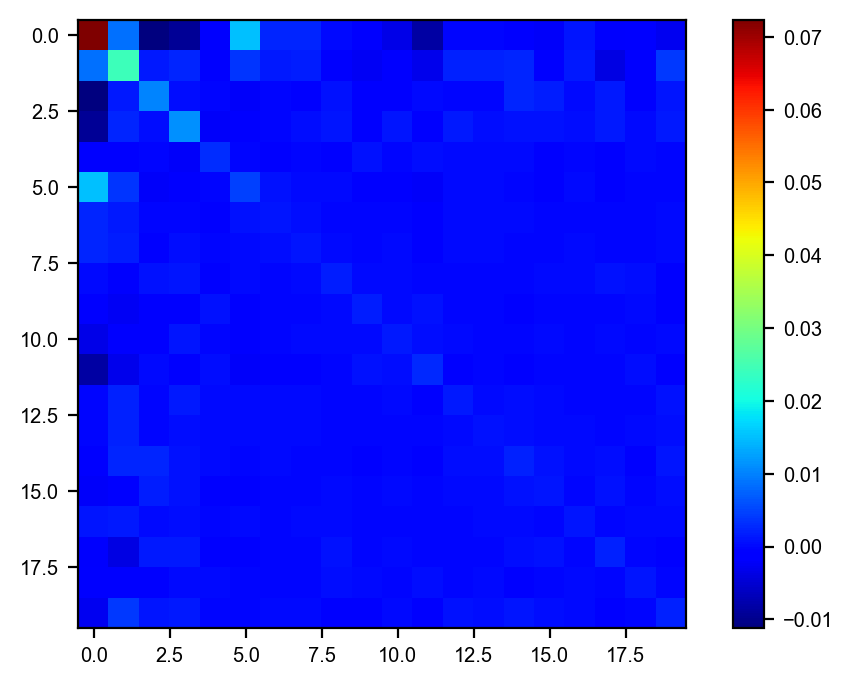

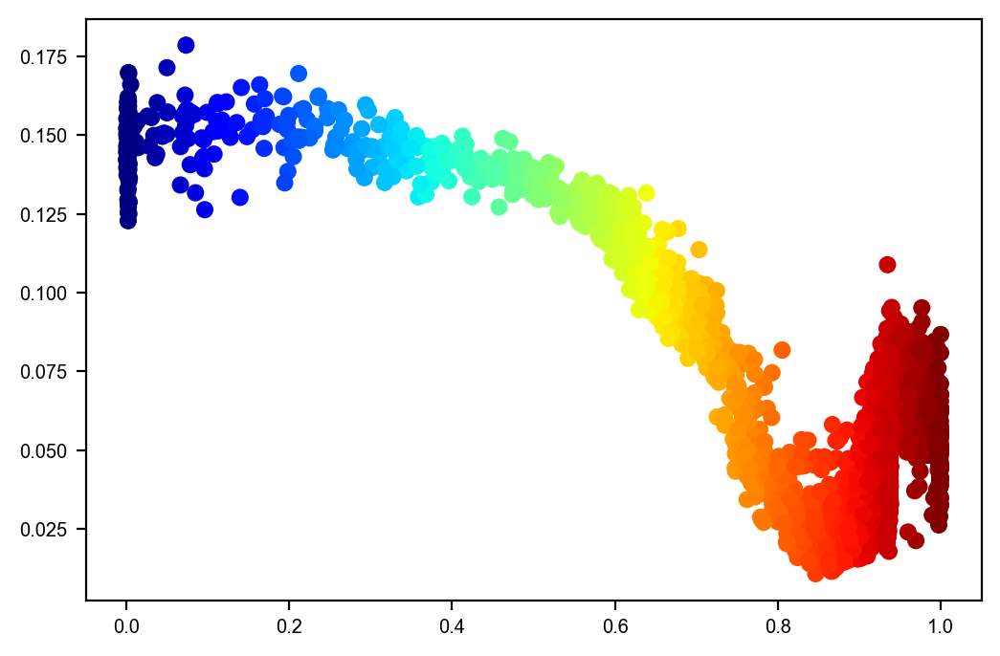

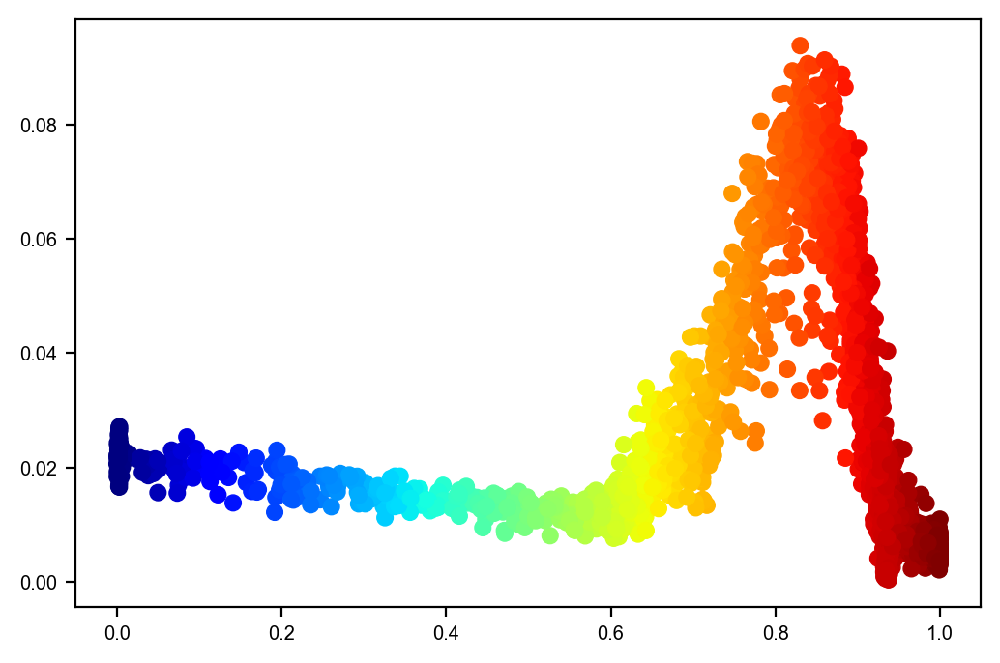

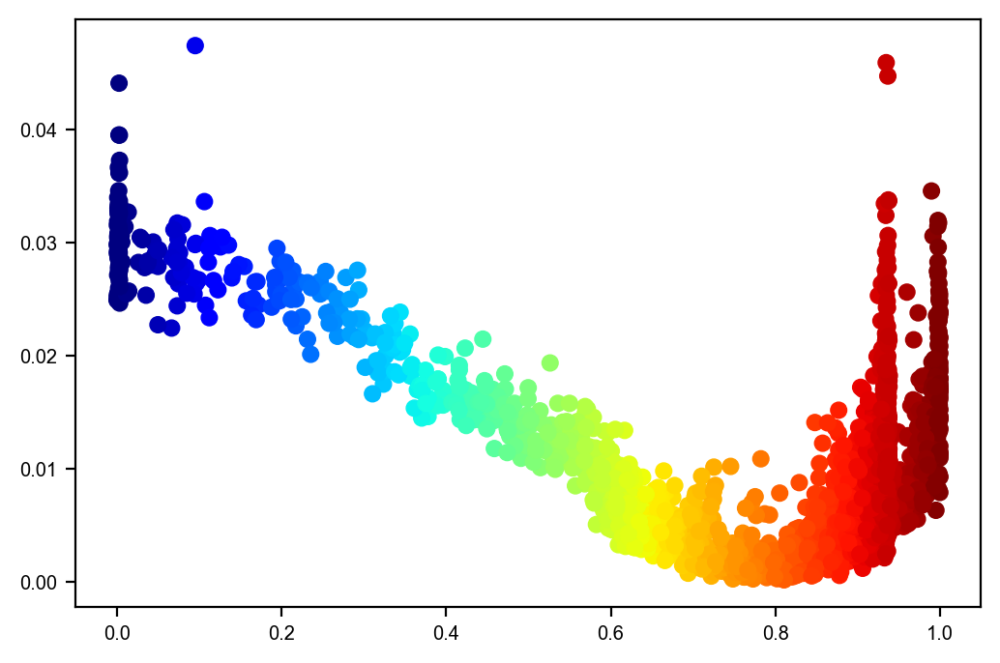

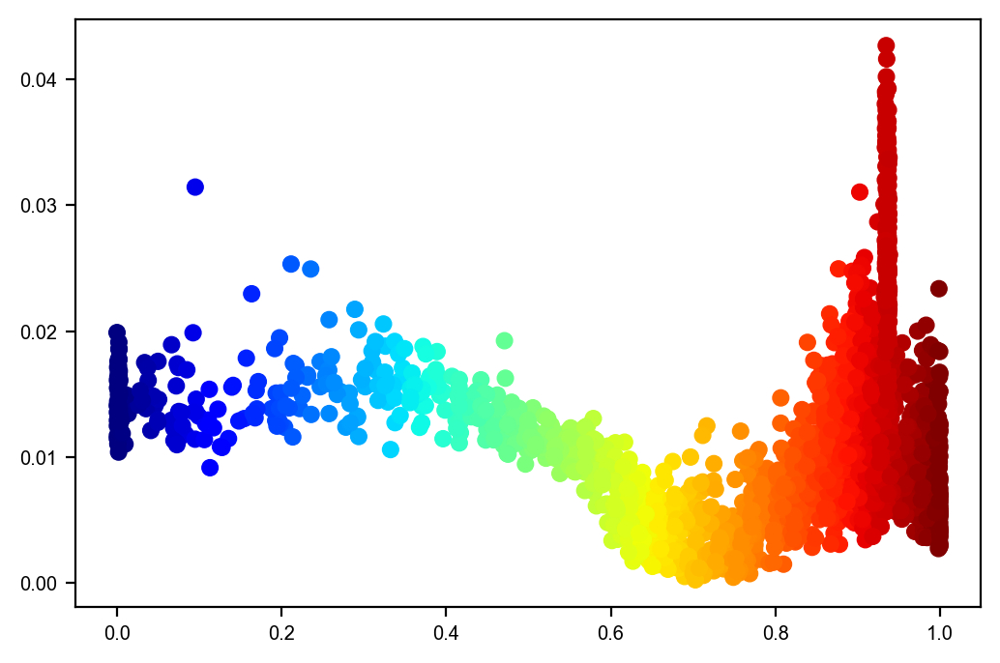

...

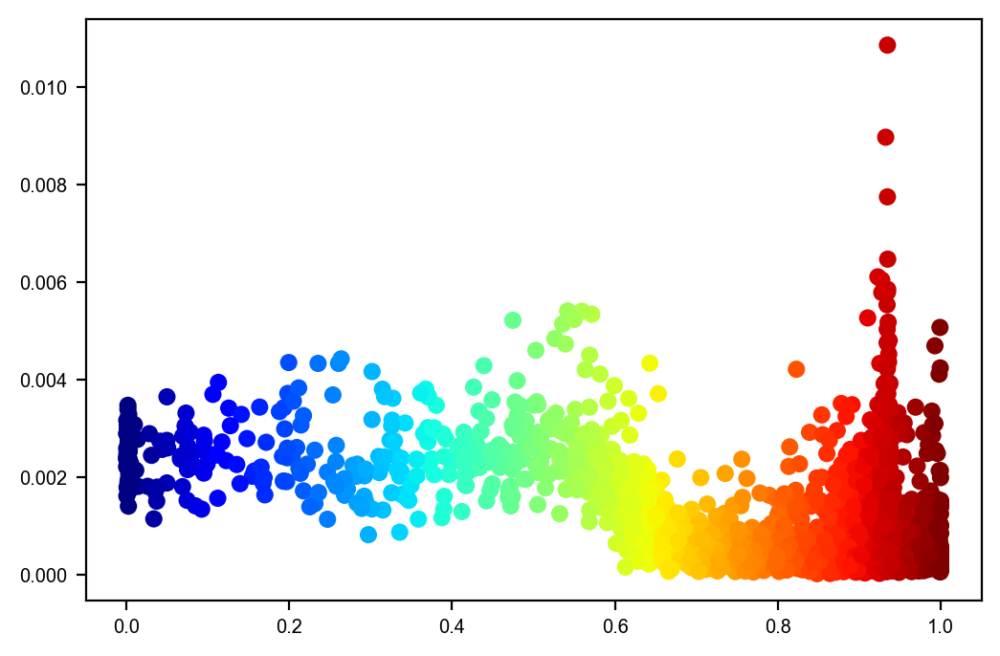

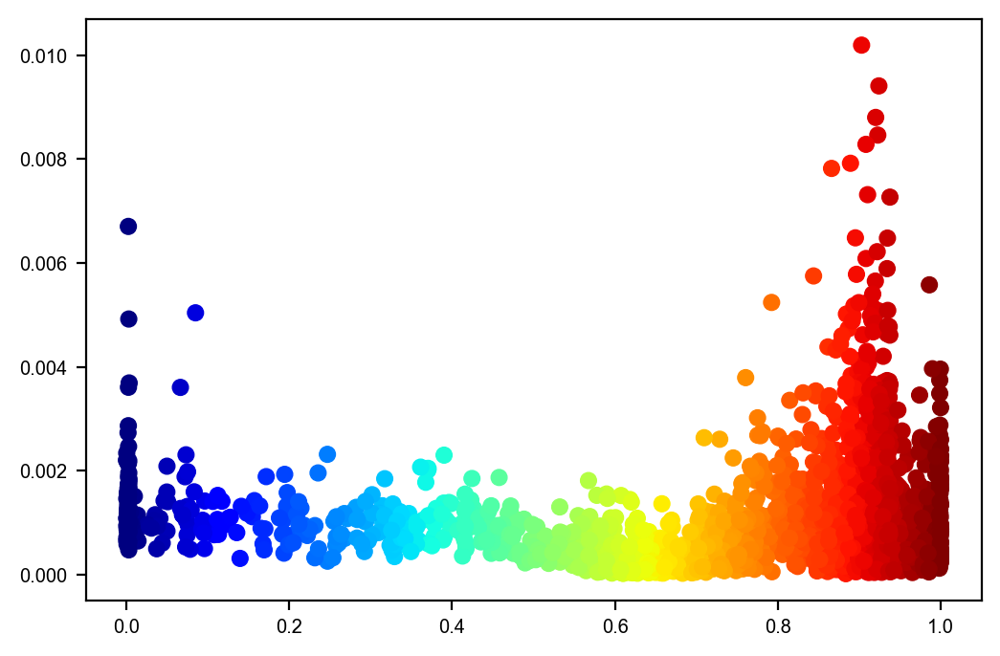

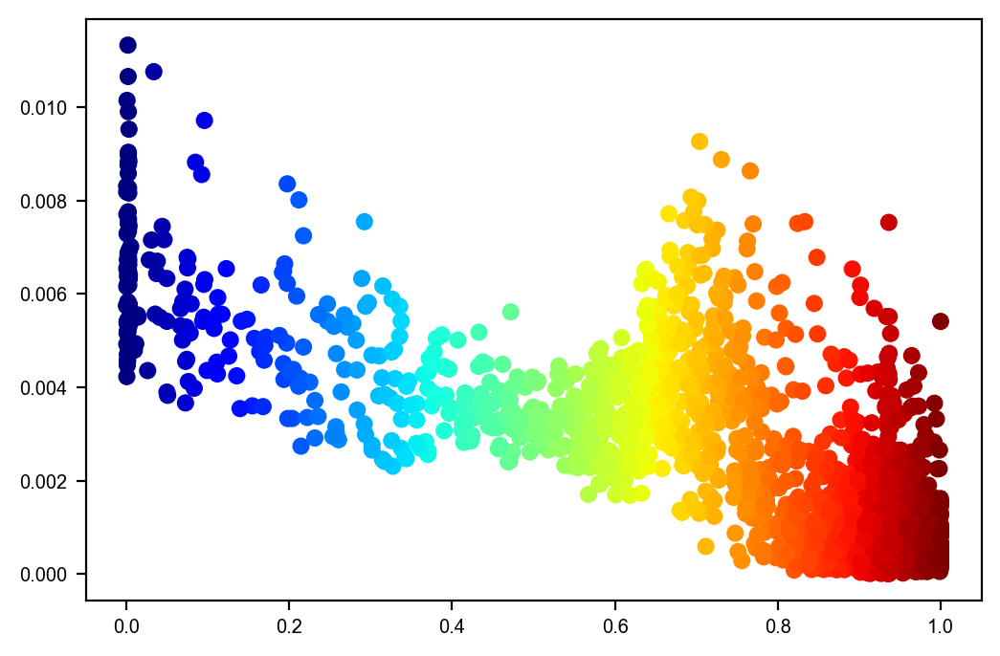

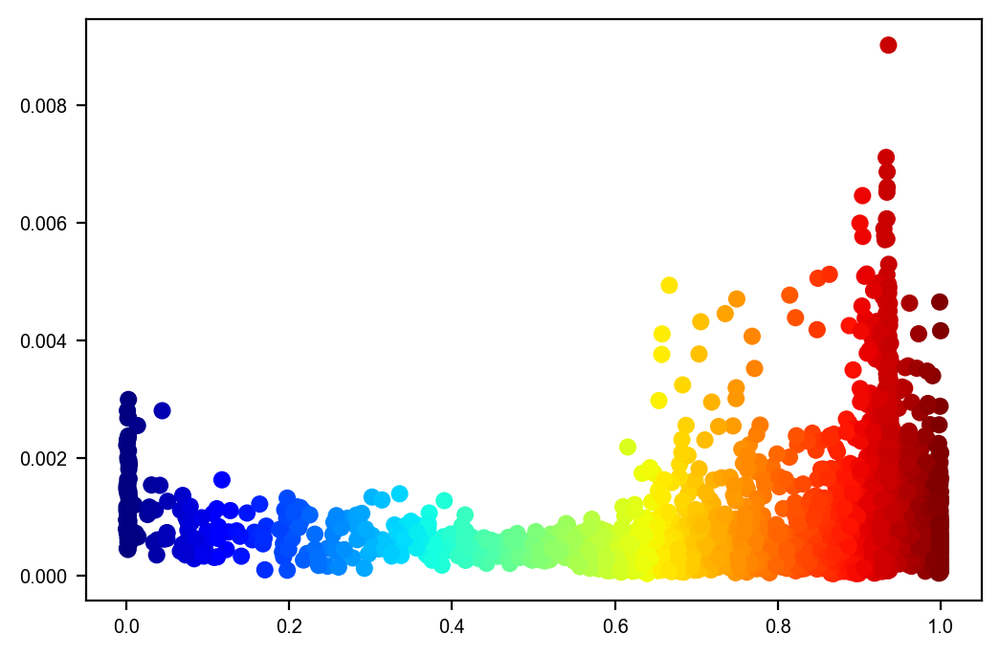

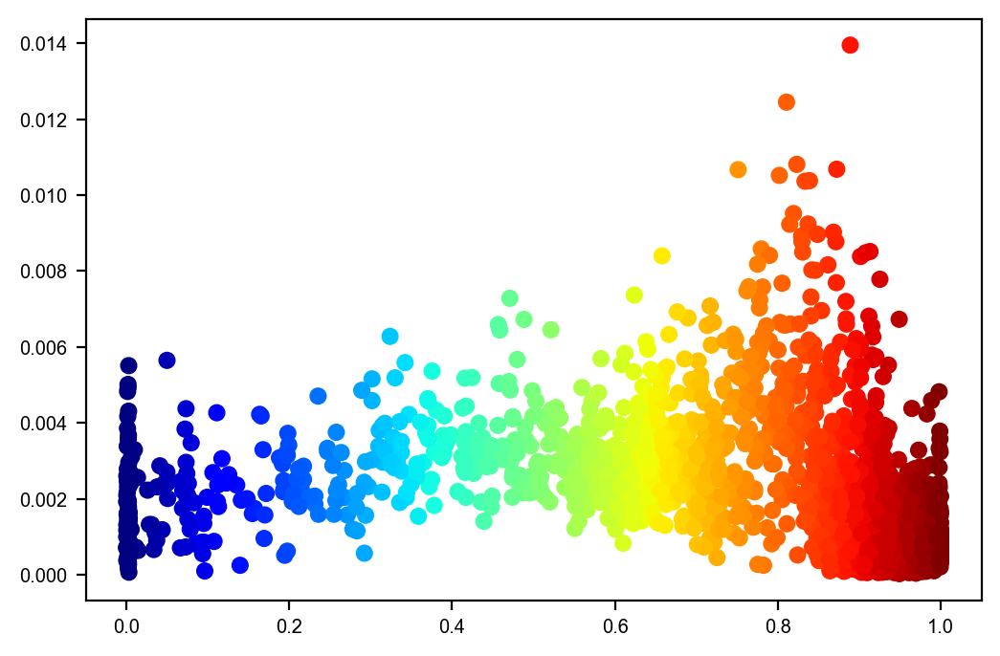

In [59]:
plt.imshow(np.mean(pca_gij,axis=0),cmap=plt.cm.jet)
plt.colorbar()
plt.show()

for j in range(pca_dim):
    plt.scatter(cell_vpt,pca_gij[:,j,j],c=cell_vpt,cmap=plt.cm.jet)
#         plt.yscale('log')
    plt.show()


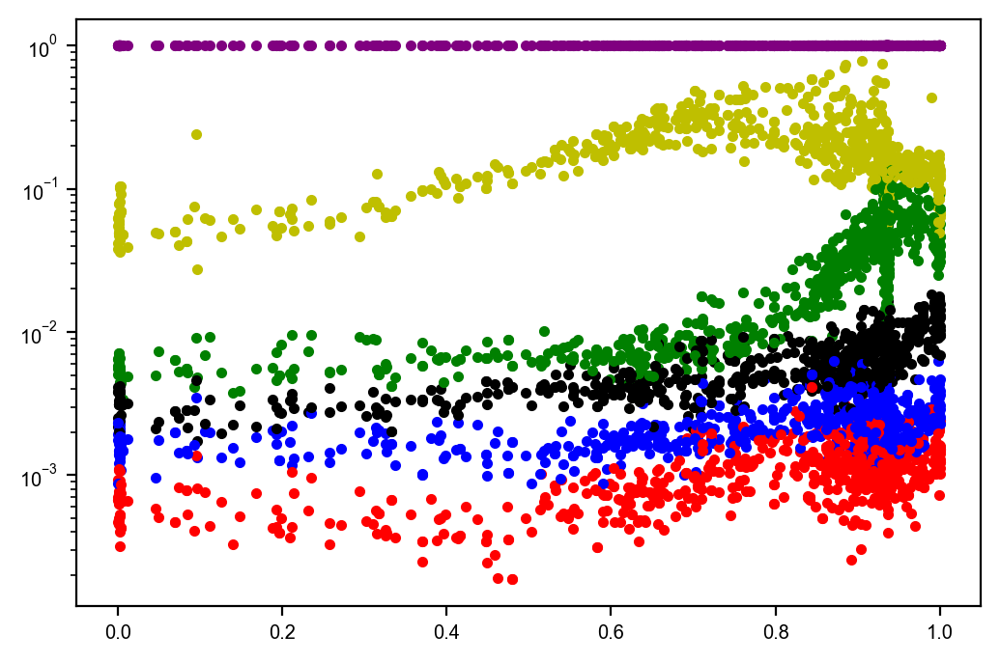

In [60]:

cs=['r','b','k','g','y','purple','cyan']
rinds=np.random.choice(pca_gij.shape[0],size=800)
for xi in rinds:#range(pca_gij.shape[0]):
    fim_eigen=np.sort(np.linalg.eig(pca_gij[xi,:,:])[0])[-6:]
    fim_eigen=np.real(fim_eigen/np.amax(fim_eigen))
#     print(fim_eigen)
    for j in range(6):
        plt.plot(cell_vpt[xi],fim_eigen[j],'.',color=cs[j])
        plt.yscale('log')
plt.show()

# for xi in rinds:#range(pca_gij.shape[0]):
#     fim_eigen=np.sort(pca_gij[xi,:,:].flatten())[-2:]
#     fim_eigen=fim_eigen/np.amax(fim_eigen)
    
#     for j in range(fim_eigen.shape[0]):
#         plt.plot(cell_vpt[xi],fim_eigen[j],'.')
#         plt.yscale('log')
# plt.show()
    

In [61]:
z_velo=[]
zv2 = np.array([velo_pca[l]@pca_gij[l]@velo_pca[l] for l in range(pca_gij.shape[0])])
zv1 = np.sqrt(zv2)

In [66]:
zv1_smooth=smooth_func(zv1,cell_nei,nei_w)
# zv1_smooth=zv1.copy()
# for ci in range(len(zv1)):
#     zv1_smooth[ci]=np.dot(zv1[cell_nei[ci,:]],nei_w[ci,:])

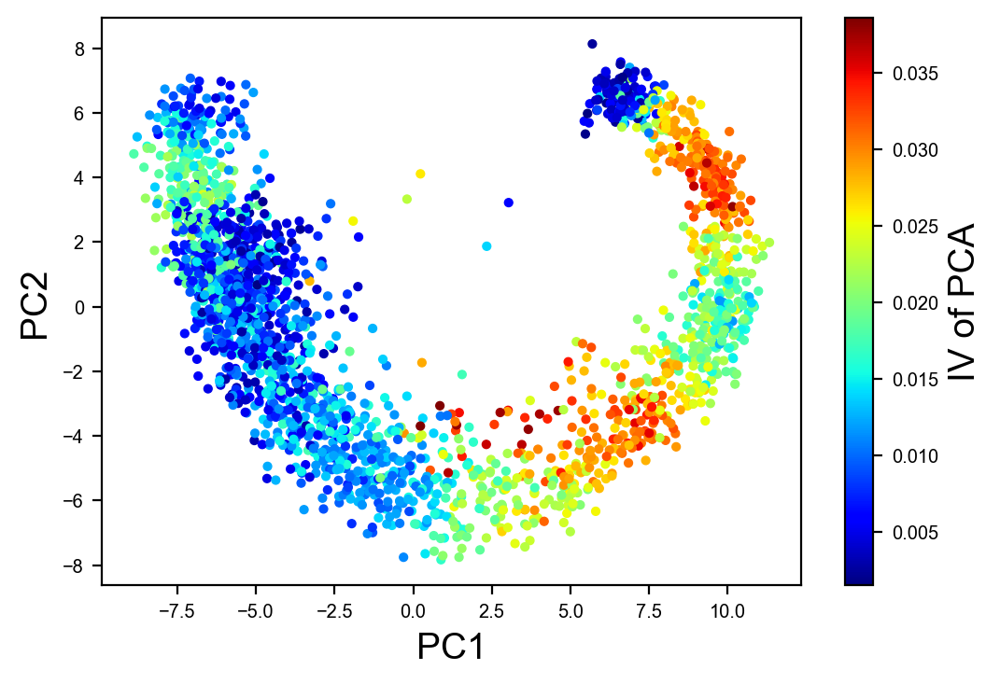

In [68]:
plt.scatter(X_pca[:,0],X_pca[:,1],s=10,c=zv1_smooth,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)

clb=plt.colorbar()

clb.ax.set_ylabel('IV of PCA',fontsize=14)
plt.savefig(result_path+'DG_PCA_iv.png')
plt.show()


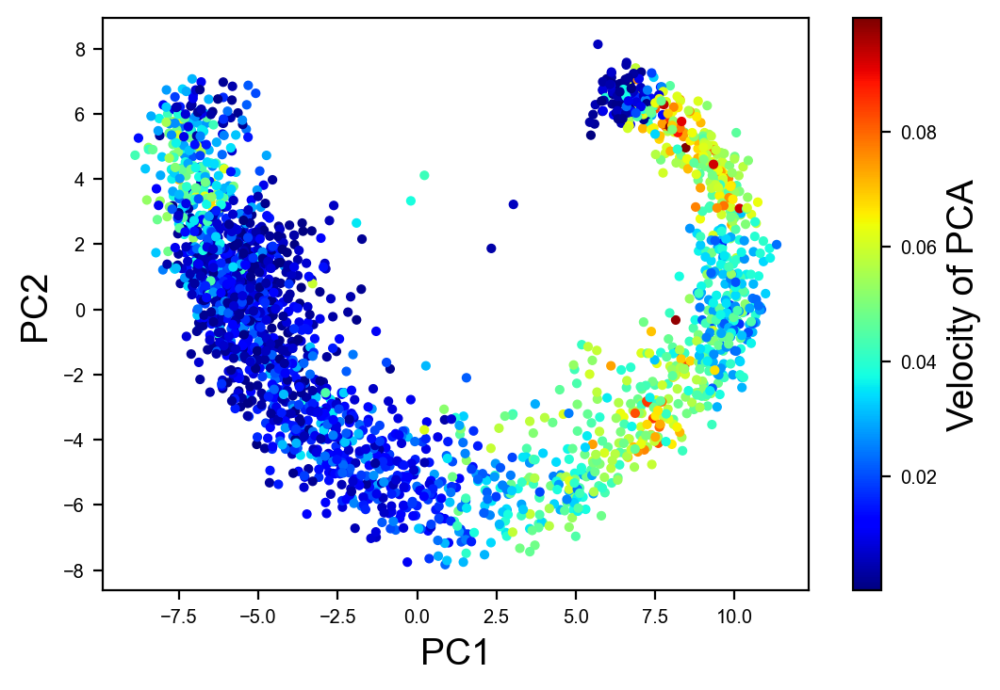

In [69]:
pca_v_norm = np.array([np.dot(velo_pca[l],velo_pca[l]) for l in range(pca_gij.shape[0])])
plt.scatter(X_pca[:,0],X_pca[:,1],s=10,c=pca_v_norm,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)

clb=plt.colorbar()

clb.ax.set_ylabel('Velocity of PCA',fontsize=14)
plt.savefig(result_path+'DG_PCA_velo.png')
plt.show()


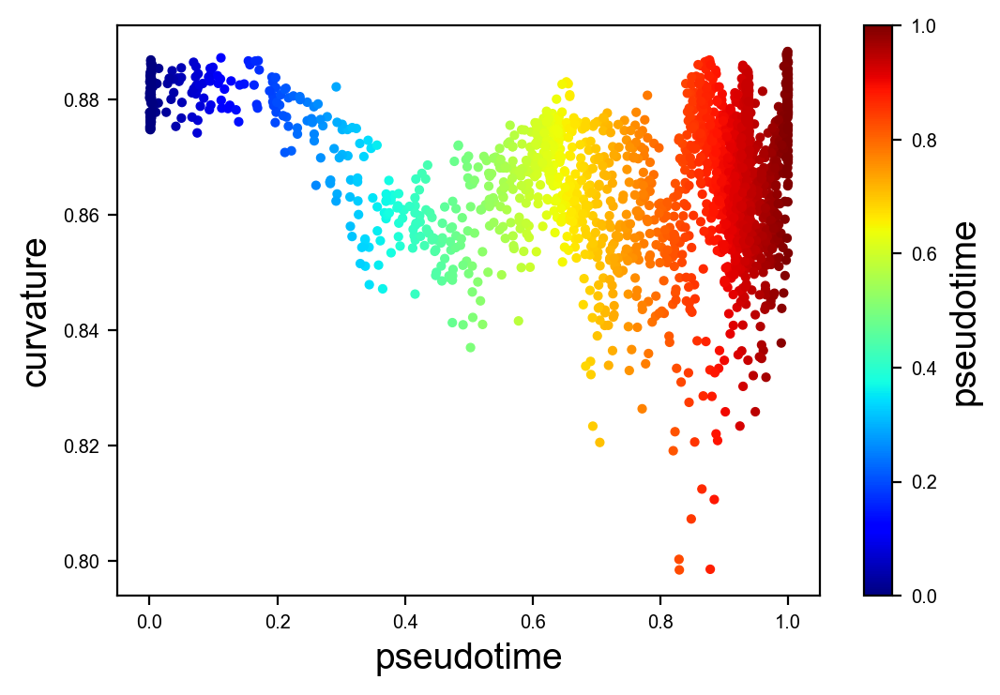

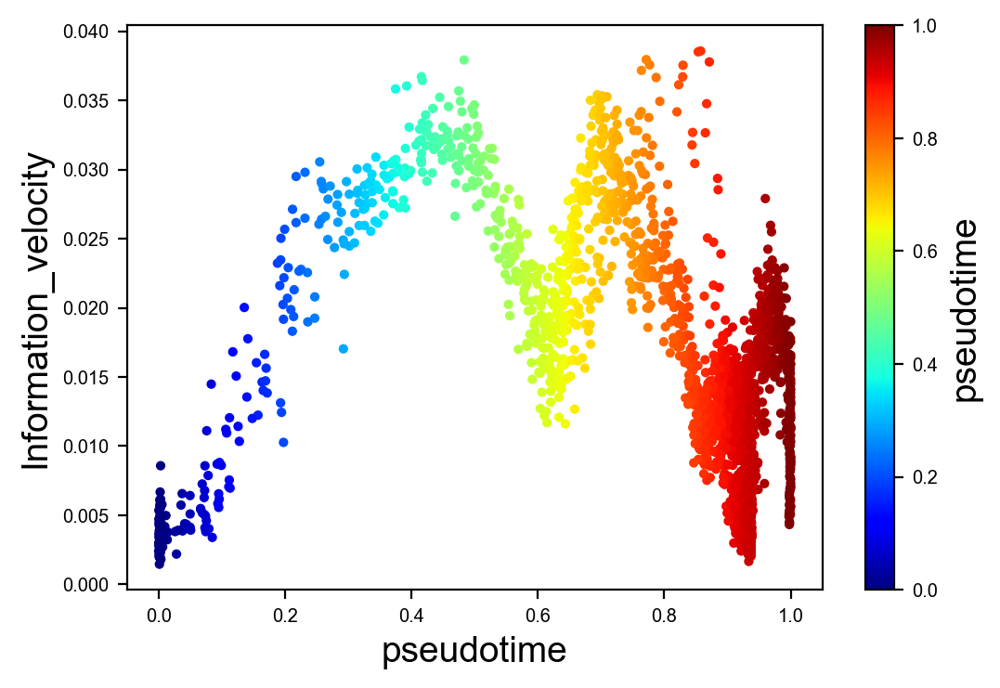

In [70]:
plt.scatter(cell_vpt,cRc_smooth,c=cell_vpt,s=10,cmap=plt.cm.jet)
plt.xlabel('pseudotime',fontsize=14)
plt.ylabel('curvature',fontsize=14)
clb=plt.colorbar()

clb.ax.set_ylabel('pseudotime',fontsize=14)
plt.savefig(result_path+'DG_vpt_cur.png')
plt.show()

plt.scatter(cell_vpt,zv1_smooth,c=cell_vpt,s=10,cmap=plt.cm.jet)

plt.xlabel('pseudotime',fontsize=14)
plt.ylabel('Information_velocity',fontsize=14)
clb=plt.colorbar()

clb.ax.set_ylabel('pseudotime',fontsize=14)
plt.savefig(result_path+'DG_vpt_iv.png')
plt.show()